# Analysing single-cell data for T immunologist

# Goals

By the end of this tutorial you should be able to:

- analyse different single cell RNA sequencing (scRNA-seq) data objects;
- perform quality control and data normalisation;
- perform demensionality reduction (PCA, UMAP) and clustering;
- perform batch correction using BBKNN;
- use automated cell type annotation (CellTypist);
- prepare data for the use with different tools (CellphoneDB);

# Input dataset

Data produced in a single cell RNA-seq experiments gained popularity over its predecessor bulk RNA-seq due to its ability to measure heterogeniety of cells in the sample. Two characteristics that are important to keep in mind when working with scRNA-seq are drop-out (the excessive amount of zeros due to limited mRNA) and the potential of biology to be confounded by technical factors (e.g. batch, donor ect.). 

For this tutorial we will use scRNA-seq data from T cells of healthy tissues published in [Dominguez Conde et al., Science, 2022](https://www.science.org/doi/10.1126/science.abl5197). This data was generated using 5' 10X kit and have a matching VDJ-seq information.

# Introduction 

In this session, we will begin by loading data, inspecting the count matrices and creating data object with counts, genes and metadata. This session will also guide you to how to check the quality of your cells. This includes: checking the quality of the generated count data, preprecessing the data for analysis and visualising them by clustering. This is most basic workflow that you will run in any single-cell data analysis.

There are many packages, which have a collection of functions for running single-cell analysis workflows in R such as [Seurat](http://satijalab.org/seurat/). Today we will use [Scanpy toolkit](https://scanpy.readthedocs.io/en/stable/tutorials.html) for data analysis using Python. 

# Pre-processing and dimensionality reduction

## 1 Load relevant packages. 

In [2]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc

import matplotlib.pyplot as plt
import seaborn as sns
import bbknn
import celltypist
sc.settings.set_figure_params(dpi=100, color_map='OrRd')

You can check package versions using ```sc.logging.print_header()``` for future reproducability of your results.

In [3]:
sc.logging.print_header()

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.21.5 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


## 1.2 Read counts matrix

Typically the alignment tool (e.g. cellranger) output files include matrix.mtx, barcodes.tsv, genes.tsv files with raw or filtered counts. These can be uploaded using ```sc.read_10x_mtx``` function in Scanpy. There is also an option to download a filtered_feature_bc_matrix.h5 object. In this case the file can be read using ```sc.read_10x_h5``` function. 

Let's first load and examine a single healthy donor T cell run in our directory.

**Note**: Change the directory name to mydir/ where you store your data

In [4]:
counts_matrix_filename = "/mnt/Gut_projects/megagut/data/remapped/Pan_T7917821/filtered/"
adata = sc.read_10x_mtx(counts_matrix_filename)  # scanpy function to read in 10x count data
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

## 1.3 Examine counts matrix

- How big is the matrix?

In [5]:
adata

AnnData object with n_obs × n_vars = 2888 × 36601
    var: 'gene_ids', 'feature_types'

Here we see the counts matrix has 36601 genes or vars (columns) and 2888 cells or obs (rows).

- Why use sparse matrix vs dense matrix?

Storing the matrix in a dense format (where all count values including zeros are stored) takes almost 30 times more memory than sparse matrix. This memory saving is very important, especially as data sets are now being created that are beyond a million cells. These matrices can become unmanageable without special computing resources.

In the sparse representation, we assume that the majority of count values in a matrix are zero. We only store the non-zero values. 

Let's check the difference in the number of bytes required to store the underlying data between sparse matrix & dense matrix. 

In [6]:
adata.X.data.nbytes + adata.X.indices.nbytes + adata.X.indptr.nbytes

13660468

In [7]:
adata.X.todense().nbytes

422814752

## 1.4 Examine andata object

In andata object, cell annotations, gene names and counts are stored in a particular way ilustrated in the image below. 

- adata.obs stores metadata of cells, where each row is a cell and column is batch number, donor name, cell annotation, or any other factors recorded for the experiment. 
- adata.var stores genes or features both as gene names and ENSMBL IDs
- adata.X stores the counts and untransformed or raw version of adata.X counts can be stored in adata.raw.X
- adata.uns stores unstructured annotation, such as annotation colors, as dictionary. 

With dimensionallity reduction we will also introduce adata.obsm, which stores multi-dimensional annotation of observations- this is where you can find your UMAP or tSNE coordinates. 

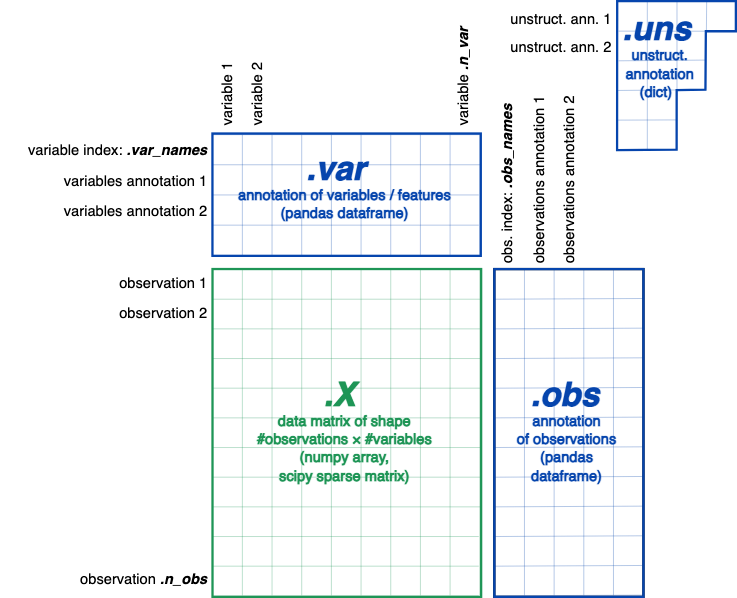 



## 1.5 Combine multiple data runs

You will most likely have multiple files from different experiments or sequencing runs that will need to be concatenated. Here we will load the remaining donors and create a single seurat object with all data. 

In [8]:
path = "/mnt/Gut_projects/megagut/data/remapped/"

d = {'SampleID': ['Pan_T7917821', 'Pan_T7917827'], 'sample_name': ['403C_caecum', '403C_duodenum']}
metadata = pd.DataFrame(d)

In [182]:
adata = [sc.read_10x_mtx(path + filename + '/filtered/') 
         for filename in list(metadata["SampleID"])]

In [183]:
for i in range(len(adata)):
    adata[i].var_names_make_unique()
    adata[i].obs['SampleID'] = metadata['SampleID'][i]
    adata[i].obs.index = adata[i].obs.index + adata[i].obs["SampleID"]
    for col in metadata.columns:
        adata[i].obs[col] = metadata[col][i]

In [184]:
adata = adata[0].concatenate(adata[1:])

**Task**: Inspect your adata object and report how many cells you have in each 10x run. What categories were added into your metadata?  

In [185]:
adata

AnnData object with n_obs × n_vars = 16020 × 36601
    obs: 'SampleID', 'sample_name', 'batch'
    var: 'gene_ids', 'feature_types'

In [186]:
adata.obs.head(3)

,SampleID,sample_name,batch
AAACCTGCATTTGCCCPan_T7917821-0,Pan_T7917821,403C_caecum,0
AAACCTGGTAGCGATGPan_T7917821-0,Pan_T7917821,403C_caecum,0
AAACCTGTCTCCAGGGPan_T7917821-0,Pan_T7917821,403C_caecum,0


It is useful to know how to subsample your object, especially if you are working with huge cell atlases. 
We will subsample 5000 cells from our object. 
Note: use ```random_state=0``` to make sure that you select the same cells each time you run your code. 

In [187]:
adata_downsampled_0 = sc.pp.subsample(adata, fraction=None, n_obs=5000, random_state=0, copy=True) #copy=True leaves keeps the full object as adata 

**Task**: Can you note how many cells from each batch you have included in the downsampled object? 

In [188]:
adata_downsampled_0.obs["batch"].value_counts()

1    4114
0     886
Name: batch, dtype: int64

In this example we had unequal representation of two batches. Most of the time we will want to ensure that we subsample donors or batches equally. 

We can ensure we subsample batches equally. 

In [212]:
adata.obs["batch"].value_counts()

1    13132
0     2888
Name: batch, dtype: int64

In [213]:
chosen_idx = adata.obs.groupby("batch").sample(n=2888, random_state=1).index
adata_downsampled_1 = adata[adata.obs_names.isin(chosen_idx)]

In [214]:
adata_downsampled_1.obs["batch"].value_counts()

0    2888
1    2888
Name: batch, dtype: int64

# 2. Pre-process dataset for analysis 



## 2.1 Filtering low-quality cells

There are many steps that can go wrong in a scRNA-seq experiment. Your cells might have died before loading, which would yield low UMI counts from cells and higher background. Sometimes cell counting might have failed, resulting in over-loading. In this case, you may have high number of doublets. It's thus important to perform general QC for each run to filter out the outliers.

Additionally, we would like to exclude cells that are damaged or dying. A common metric to identify such cells is the relative expression of mitochondrially derived genes. When the cells apoptose, their mitochondrial RNA leaks into the cells. Thus a relative enrichment of mitochondrially derived genes can be a sign of cell stress. 

Let’s do some plotting to look at the number of expressed genes per cell (often called complexity), reads per cell and cell quality measure mitochondrial genes per cell.

 

In [18]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

**Note**: Can you think of other quality control metrics you would like to calculate?
How would you calculate percentage of ribosomal genes in your data? 

In [19]:
adata.var['rb'] = adata.var_names.str.startswith(('RPS','RPL'))  # annotate the group of ribosomal genes as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

... storing 'SampleID' as categorical
... storing 'sample_name' as categorical
... storing 'feature_types' as categorical


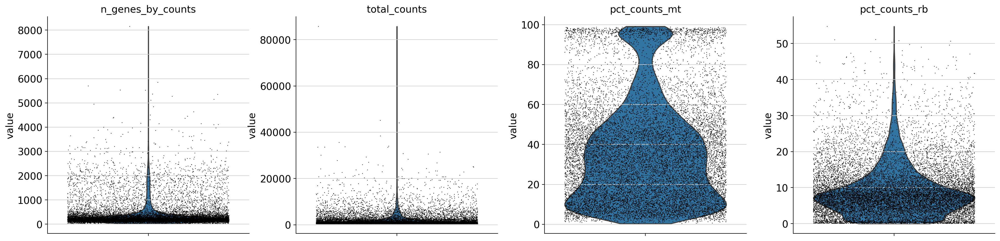

In [20]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb'],
             jitter=0.4, multi_panel=True)


There are cells with over 80% mitochondrial RNA reads. These are likely dying/stressed cells. 

**Task**: Can you plot the relationship between n_genes_by_counts vs percent_mt? What is the correlation? What filter would you use to filter out the dying cells?

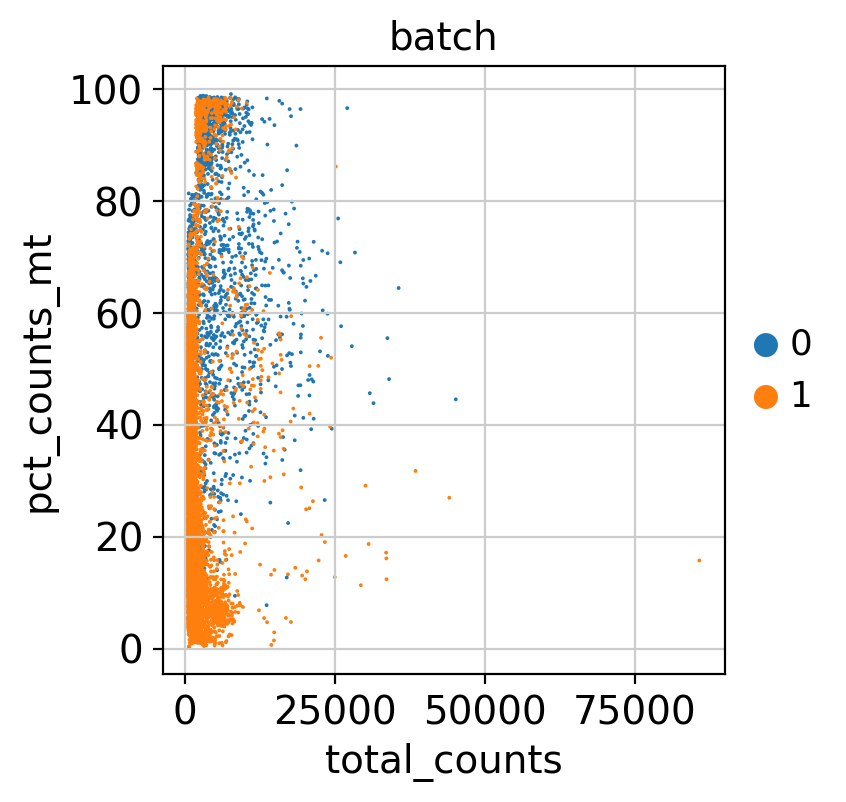

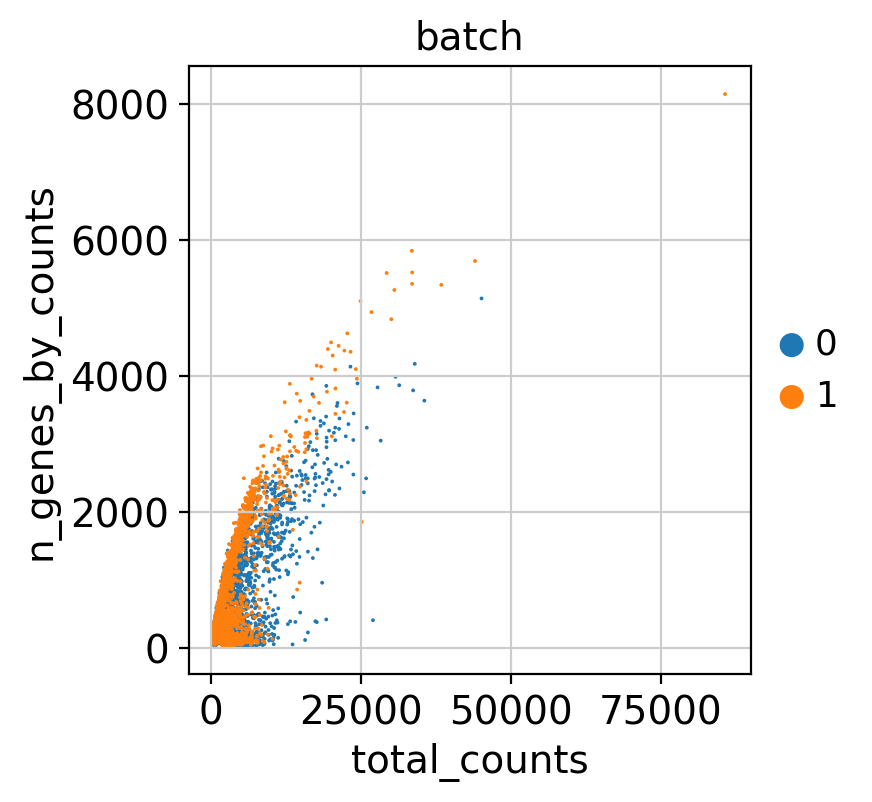

In [21]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color= "batch"  ) #note you can color your cells by variables in .obs
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color = "batch" ) #note you can color your cells by variables in .obs

It would be potentially useful to filter cells with high mitochondrial counts. However, there is no clear treschold to apply. A conservative treschold would be to filter out cells with >20%, others would filter out cells with >80% mitochondrial genes. 

The authors did not filter based on mitochondrial genes. Let’s filter the cells following the authors QC thresholds: 
1. n_genes 600 < x 
2. n_counts > 1000
    
**Task**: Try changing the thresholds to what you think they should be according to the violin plots. How many cells are you left with?

In [22]:
sc.pp.filter_cells(adata, min_genes = 600)
sc.pp.filter_cells(adata, min_counts = 1000)

In [23]:
adata

AnnData object with n_obs × n_vars = 2027 × 36601
    obs: 'SampleID', 'sample_name', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb'
    uns: 'batch_colors'

## 2.2 Expression normalization

After removing unwanted genes cells from the dataset, the next step is to normalize the data. By default, we employ a global-scaling normalization method ```sc.pp.normalize_total()``` that normalizes the gene expression measurements for each cell by the total expression, multiplies this by a scale factor (10,000 by default), and use ```sc.pp.log1p(adata)``` funtion that log-transforms the result. 

There have been many methods to normalize the data, but this is the simplest and the most intuitive. The division by total expression is done to change all expression counts to a relative measure, since experience has suggested that technical factors (e.g. capture rate, efficiency of reverse transcription) are largely responsible for the variation in the number of molecules per cell, although genuine biological factors (e.g. cell cycle stage, cell size) also play a smaller, but non-negligible role. 

In [24]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [30]:
adata.X.max()

8.641864

You would typically continue with the next steps, however here we want to make sure we are working with T cell object. 
Therefore, for the rest of the tutorial we will be working with the T cell object provided by the authors [here](https://www.tissueimmunecellatlas.org/).

**Task**: Can you tell what type of data is stored in this object? Is it raw or normalised counts?  

In [284]:
!wget https://cellgeni.cog.sanger.ac.uk/pan-immune/t-cells.h5ad

--2022-06-23 14:25:43--  https://cellgeni.cog.sanger.ac.uk/pan-immune/t-cells.h5ad
Resolving cellgeni.cog.sanger.ac.uk (cellgeni.cog.sanger.ac.uk)... 172.27.51.1, 172.27.51.130, 172.27.51.3, ...
Connecting to cellgeni.cog.sanger.ac.uk (cellgeni.cog.sanger.ac.uk)|172.27.51.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3009830730 (2.8G) [application/x-hdf]
Saving to: ‘t-cells.h5ad’

t-cells.h5ad        100%[===================>]   2.80G   310MB/s    in 9.1s    

2022-06-23 14:25:52 (315 MB/s) - ‘t-cells.h5ad’ saved [3009830730/3009830730]



In [285]:
adata_t = sc.read_h5ad("./t-cells.h5ad")

In [286]:
adata_t.X.max()

8.569769

In [245]:
# rerun this command to have the mt gene metrics.
adata_t.var['mt'] = adata_t.var_names.str.startswith('MT-') 
sc.pp.calculate_qc_metrics(adata_t, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

**Task**: Can you inspect how the cells in this object have been filtered?  

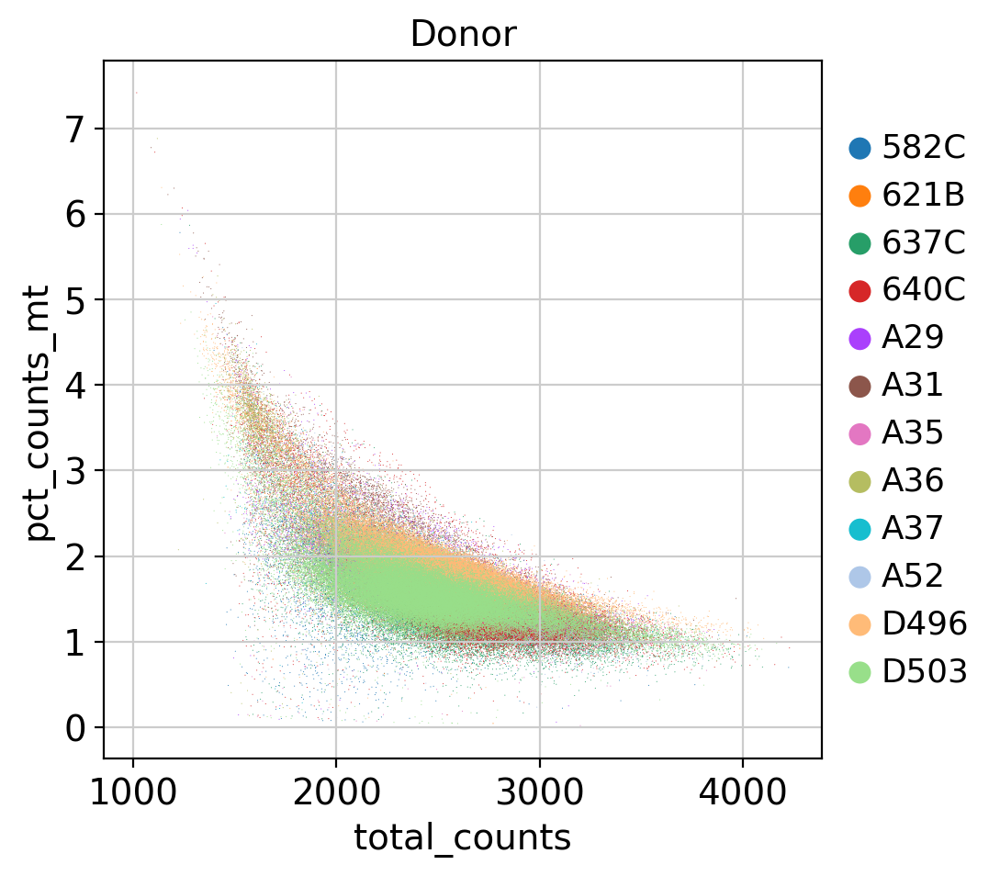

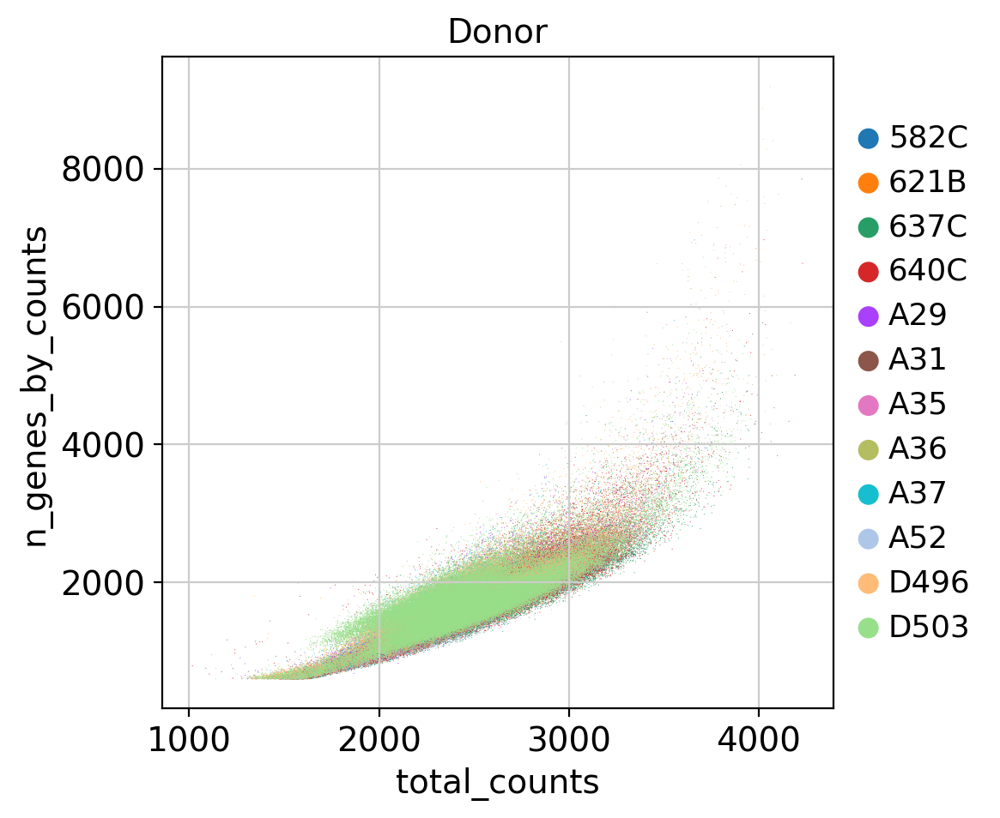

In [246]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.scatter(adata_t, x='total_counts', y='pct_counts_mt', color= "Donor"  ) #note you can color your cells by variables in .obs
sc.pl.scatter(adata_t, x='total_counts', y='n_genes_by_counts', color = "Donor" ) #note you can color your cells by variables in .obs

## 2.3 Finding highly variable genes

Currently there are over 30,000 captures genes in your matrix (features). However, many of these genes are constitutively expressed across all cells (housekeeping genes, ribosomal protein mRNAs), which is not so informative to characterise cell type and function. Hence, it is very useful to select some genes that shows significant variation in your dataset (feature selection precess). This not only helps focusing your analysis onto more interesting variation, but also reduces dimensionality of your matrix, making it faster to run downstream processes!

Scanpy calculates highly variable genes and focuses on these for downstream analysis. 

```sc.pp.highly_variable_genes``` calculates the average expression and dispersion for each gene, places these genes into bins, and then calculates a z-score for dispersion within each bin. This helps control for the relationship between variability and average expression. ```subset = True``` automatically subsets the object to highly variable genes. 

In [247]:
adata_t.raw = adata_t
sc.pp.highly_variable_genes(adata_t, subset=True)

In some cases, there are genes that could introduce unnecessary variability in downstream analysis. For example, cell cycle genes or in T cell case V(D)J genes. 

We can exclude these genes from the highly variable gene set. 

In [237]:
def intersection(lst1, lst2): 
    lst3 = [value for value in lst1 if value in lst2] 
    return lst3 

def subtraction(lst1, lst2): 
    lst3 = [value for value in lst1 if not value in lst2] 
    return lst3

In [238]:
imgt_vdj = pd.read_csv('/mnt/imgt_pip_vdj.csv')
imgt_vdj = list(imgt_vdj['0'])

In [239]:
# we can check which genes from the list were included in the hvg list. 
adata_t.var[adata_t.var.index.isin(imgt_vdj)]

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
IGKV4-1,False,4659,0.030066,97.849140,6512.559082,True,0.274616,6.582465,13.335737
IGKV1-5,False,4386,0.028293,97.975172,6128.638672,True,0.145152,6.364233,12.808448
IGKV1-6,False,374,0.002588,99.827340,560.640076,True,0.017087,5.402559,10.484863
IGKV1-9,False,781,0.005003,99.639446,1083.741821,True,0.033750,6.479019,13.085793
IGKV3-11,False,3300,0.020387,98.476532,4416.130371,True,0.080962,5.450192,10.599953
...,...,...,...,...,...,...,...,...,...
IGLV2-14,False,6005,0.037450,97.227749,8112.139648,True,0.157495,6.028264,11.996683
IGLV2-11,False,1942,0.011810,99.103462,2558.230469,True,0.041411,5.303395,10.245265
IGLV3-10,False,1564,0.009056,99.277968,1961.721924,True,0.030851,5.753402,11.332565
IGLV2-8,False,2426,0.015040,98.880020,3257.839355,True,0.041736,3.663707,6.283473


In [249]:
# here we exclude the detected vdj genes from the highly variable gene selection by assigning "False" to the
#.var["highly_variable"] column. This avoids removal of these genes from the hvg gene set and we can still 
# visualise these genes
hvg = list(adata_t.var[adata_t.var['highly_variable'] == True].index)
nohvg = intersection(hvg, imgt_vdj)
adata_t.var.loc[nohvg,  'highly_variable'] = False

In [251]:
adata_t.var["highly_variable"].value_counts()

True     1123
False     129
Name: highly_variable, dtype: int64

In [257]:
#or we can also directly remove this from the highly variable genes. In this case, if you want to see the genes on the umap,
#include "use_raw=True" in your function.
adata_t = adata_t[:,~adata_t.var_names.isin(imgt_vdj)]

In [258]:
adata_t

View of AnnData object with n_obs × n_vars = 216611 × 1123
    obs: 'Organ', 'Donor', 'Chemistry', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'hvg'
    obsm: 'X_umap'

## 2.3 Data scaling

First, regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. This part is also where you mean center the data. You also divide by the standard deviation to make everything to a ‘standard normal’, where the mean is zero and the standard deviation is 10.

In [259]:
sc.pp.regress_out(adata_t, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_t, max_value=10)

# 3. Batch correction and data visualisation

## 3.1 BBKNN and ridge_regression



Before BBKNN we need to run PCA. 

Principal component analysis (PCA) is a dimensionality reduction technique used in single-cell RNA-seq data analysis. For each data point (cell) there are ~30k features (number of genes). In layman terms, PCA combines features in a way that explains the largest amount of variance in the data. By default, only the previously determined variable features are used as input, but can be defined using features argument if you wish to choose a different subset. You can select the number of PCs you’d like to calculate, but the default number is 50.

Downstream analysis will depend on the number of PCs you use - so what is the right number? The answer will depend on the dataset. There are a couple of functions implemented in scanpy to determine the “optimal” number of PCs - the goal is to pick a number that explain the most variation, but reduce the noise in the data (and single cell data is very noisy).

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.

sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CST3')

In [73]:
adata_t.obs.head(3)

,Organ,Donor,Chemistry,Predicted_labels_CellTypist,Majority_voting_CellTypist,Manually_curated_celltype,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
Pan_T7935490_AAACCTGCAAATTGCC,ILE,A29,5v1,Type 17 helper T cells,Type 17 helper T cells,Trm_Th1/Th17,2191,2823.198730,44.587193,1.579315
Pan_T7935490_AAACGGGCATCTGGTA,ILE,A29,5v1,Cytotoxic T cells,Cytotoxic T cells,Trm_gut_CD8,2047,2751.331787,48.581337,1.765739
Pan_T7935490_AAACGGGTCTTGCATT,ILE,A29,5v1,Tem/Effector cytotoxic T cells,Cytotoxic T cells,Trm_gut_CD8,2129,2628.809082,43.174305,1.642352


### Explain ridge regression


### Mention scvi and why we cannot run it today = needs GPU. 

In [260]:
bbknn.ridge_regression(adata_t, batch_key=['Chemistry'], confounder_key=['Predicted_labels_CellTypist'])

sc.pp.pca(adata_t)
bbknn.bbknn(adata_t, batch_key='Donor')
sc.tl.umap(adata_t)

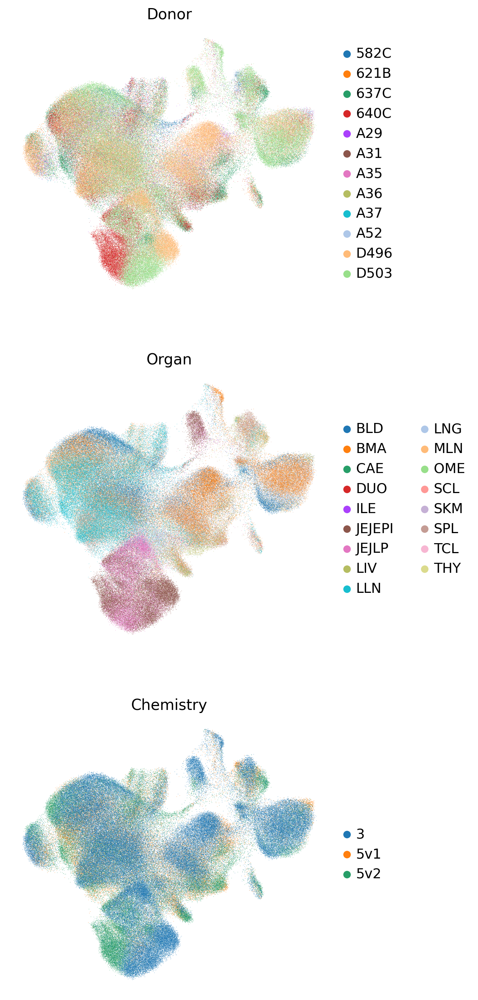

In [261]:
sc.pl.umap(adata_t, color= ["Donor", "Organ", "Chemistry"],frameon=False, ncols= 1)

# 4. Annotation 

At this point in your analysis, you’ll want to annotate your cells. This can be a task of varying difficulty - annotating PBMCs, for example, might be straightforward given the wealth of single-cell PBMC data out there already. If you have a completely novel dataset, you might have to rely on a small number of studies for marker genes. 

There are two different kinds of annotation - manual (marker-based) and automated annotation, which relies on the the whole transcriptome of a reference dataset (or markers picked in an unbiased way).

Manual annotation is the standard way of annotating data. We begin by clustering the data and finding cluster markers - there are a number of functions to do this, but today we will use DGE & wilcoxon method.


In [262]:
sc.tl.leiden(adata_t, resolution = 1) # first run leiden clustering

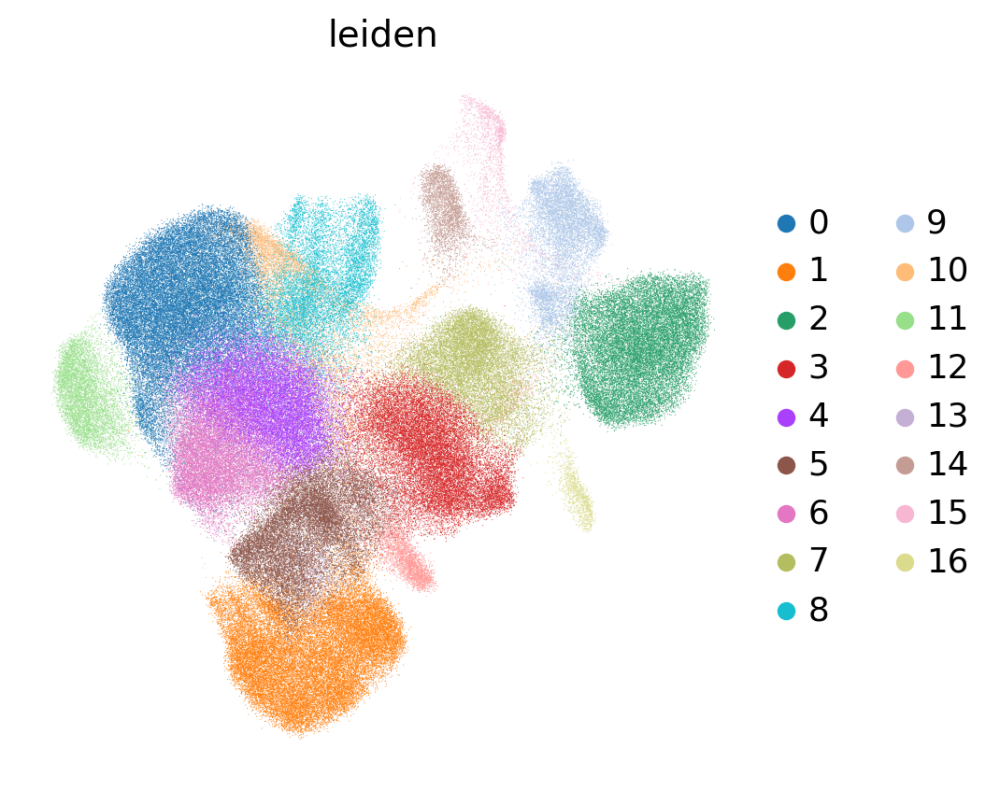

In [269]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata_t, color= "leiden",frameon=False)

In [78]:
sc.tl.rank_genes_groups(adata_t, groupby='leiden',method='wilcoxon',pts=True)

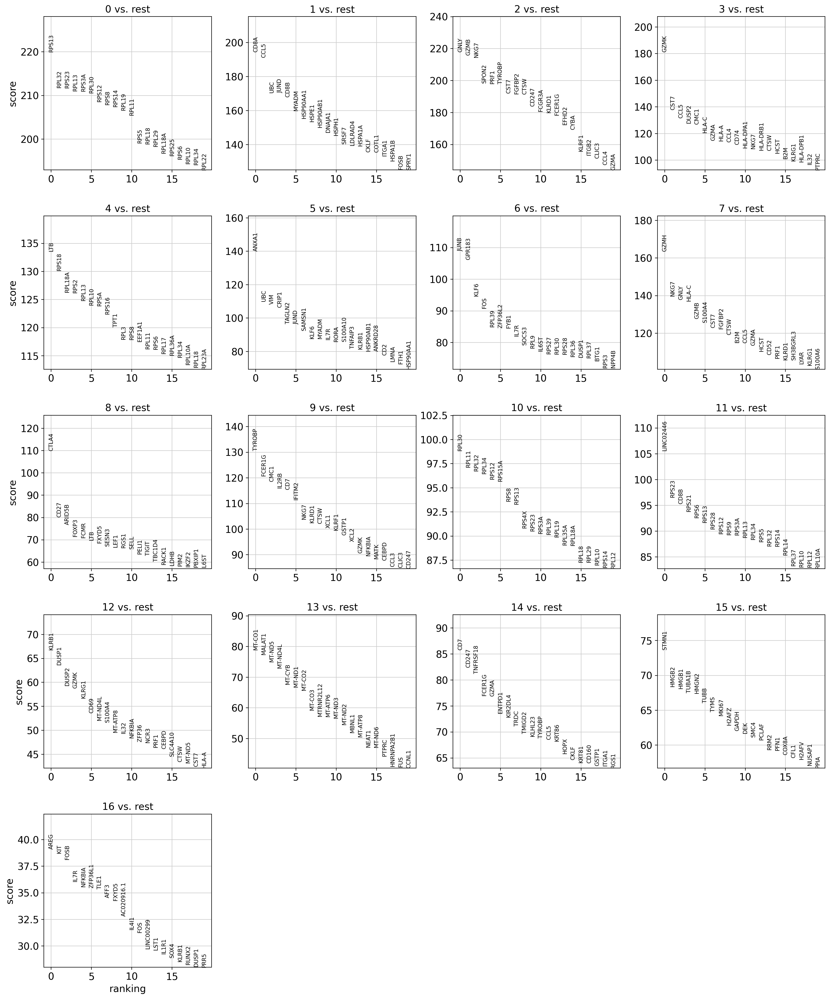

In [79]:
sc.pl.rank_genes_groups(adata_t, n_genes=20, sharey=False)

In [80]:
pts = adata_t.uns['rank_genes_groups']['pts']
pts_rest = adata_t.uns['rank_genes_groups']['pts_rest']

result = adata_t.uns['rank_genes_groups']
groups = result['names'].dtype.names

res = pd.DataFrame(index=range(0, pts.shape[0]))
for group in groups:
    df = pd.DataFrame({group + '_' + key: result[key][group] for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']})
    df[group+'_pts'] = pts.loc[df[group + '_names'], group].values
    df[group+'_pts_rest'] = pts_rest.loc[df[group + '_names'], group].values
    res = res.join(df)


In [81]:
res.head(5)

,0_names,0_pvals,0_pvals_adj,0_logfoldchanges,0_pts,0_pts_rest,1_names,1_pvals,1_pvals_adj,1_logfoldchanges,...,15_pvals_adj,15_logfoldchanges,15_pts,15_pts_rest,16_names,16_pvals,16_pvals_adj,16_logfoldchanges,16_pts,16_pts_rest
0,RPS13,0.0,0.0,1.218712,0.996150,0.972459,CD8A,0.0,0.0,3.374084,...,0.0,6.158975,0.969469,0.154487,AREG,0.000000e+00,0.000000e+00,3.084612,0.862839,0.426329
1,RPL32,0.0,0.0,1.078741,0.997665,0.979743,CCL5,0.0,0.0,3.375750,...,0.0,3.712755,0.971471,0.476006,KIT,0.000000e+00,0.000000e+00,8.318940,0.636364,0.005094
2,RPS23,0.0,0.0,1.039069,0.996119,0.975741,UBC,0.0,0.0,1.506630,...,0.0,2.299897,0.989489,0.880431,FOSB,0.000000e+00,0.000000e+00,2.398242,0.952153,0.738328
3,RPL13,0.0,0.0,1.018467,0.997980,0.984637,JUND,0.0,0.0,1.846773,...,0.0,3.900600,0.963463,0.592685,IL7R,7.530930e-285,3.062662e-281,2.211858,0.954545,0.711098
4,RPS3A,0.0,0.0,1.053411,0.996844,0.980651,CD8B,0.0,0.0,3.126626,...,0.0,2.931385,0.971471,0.652528,NFKBIA,4.189766e-277,1.533496e-273,1.914393,0.972089,0.836016


If we want to select most specific marker genes, we can use the following filtering settings:
- sub_res['pvals'] < 0.05) = significantly enriched
- (sub_res['pts'] > 0.5) = expressed in at least 50% of cells in the cluster
- (sub_res['pts_rest'] < 0.1) = expressed in less than 10% of any other cluster

In [276]:
output = pd.DataFrame()
for group in groups:
       sub_res = res[[f"{group}_{key}" for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']]]
       sub_res.columns = ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']
       sub_res['celltype'] = group
       flag = (sub_res['pvals'] < 0.05) & (sub_res['pts'] > 0.5) & (sub_res['pts_rest'] < 0.1)
       sub_res = sub_res[flag]
       output = output.append(sub_res)
output.to_csv('./TILC_markers.csv', header=True, index=False)

/tmp/ipykernel_6374/2915442709.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_res['celltype'] = group
/tmp/ipykernel_6374/2915442709.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_res['celltype'] = group
/tmp/ipykernel_6374/2915442709.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [277]:
output.head(5)

,names,pvals,pvals_adj,logfoldchanges,pts,pts_rest,celltype
76,TSHZ2,0.0,0.0,3.452872,0.523320,0.068635,0
16,ITGA1,0.0,0.0,3.748754,0.535715,0.058962,1
7,FGFBP2,0.0,0.0,5.605864,0.865113,0.069196,2
10,FCGR3A,0.0,0.0,5.068346,0.820999,0.081217,2
12,FCER1G,0.0,0.0,4.748314,0.836569,0.092679,2


In [282]:
import itertools

mks = []

for n in list(adata_t.obs['leiden'].unique()):
    mks.append(list(output[output['celltype'] == n].head(4)['names']))
    top_mks = list(itertools.chain.from_iterable(mks))

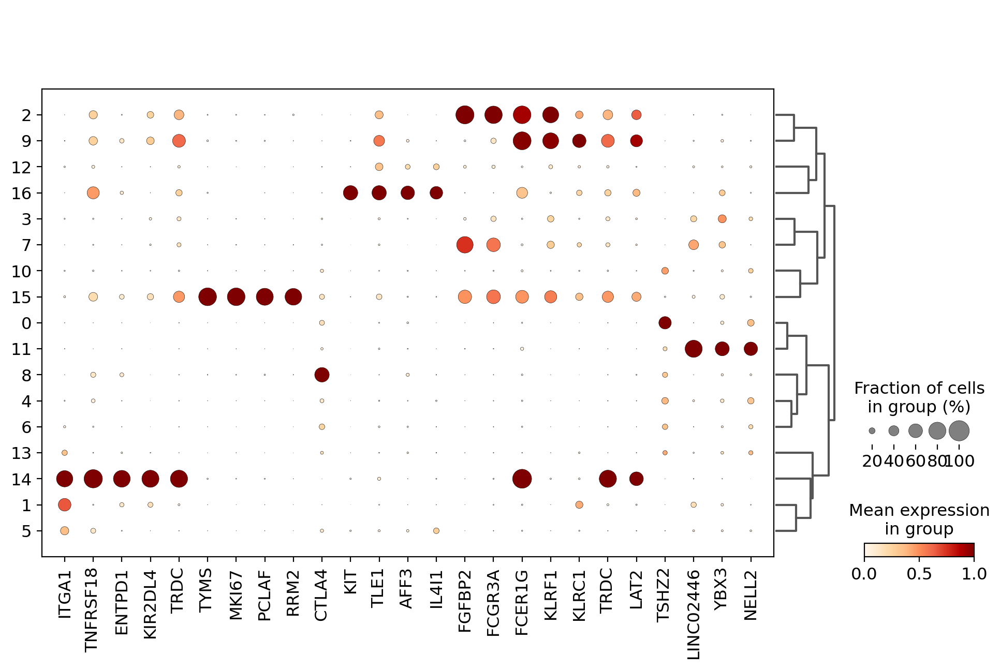

In [283]:
sc.pl.dotplot(adata_t, var_names=top_mks, groupby='leiden', standard_scale='var', cmap='OrRd', dendrogram=True)

The good part is that we already have annotations from the object and can check what the clusters were annotated as by the authors.

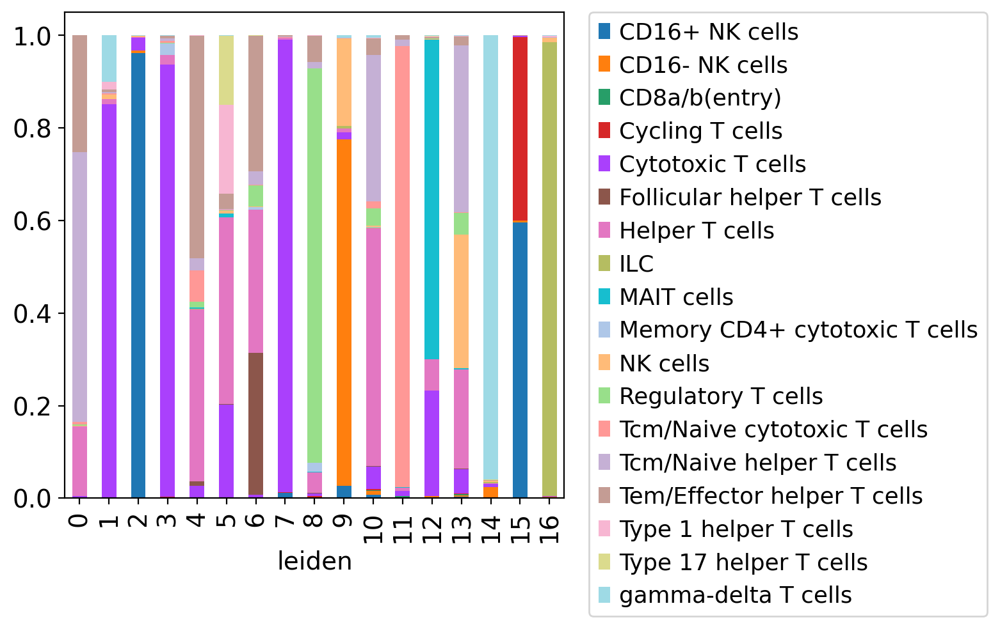

In [82]:
tmp = pd.crosstab(adata_t.obs['leiden'], adata_t.obs['Majority_voting_CellTypist'],normalize='index')
tmp.plot.bar(stacked=True, grid=False ).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

<AxesSubplot:xlabel='Majority_voting_CellTypist', ylabel='leiden'>

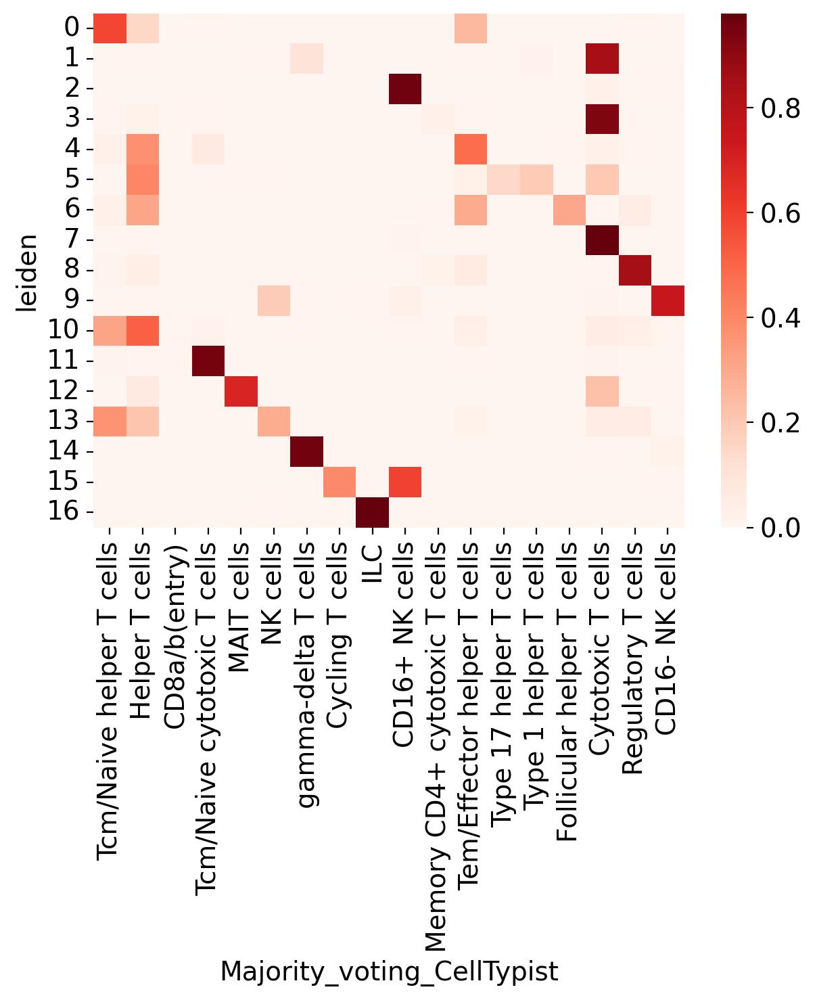

In [83]:
plt.rcParams['figure.figsize'] = [7,5]
conf_mat = sc.metrics.confusion_matrix('leiden', "Majority_voting_CellTypist",  adata_t.obs, normalize=True)

col_order = conf_mat.idxmax(0).sort_values().index
conf_mat = conf_mat[col_order] ## Sort to have some sort of diagonal
sns.heatmap(conf_mat, xticklabels=True, yticklabels=True, cmap='Reds')


It is clear that cluster 14 are "gamma-deta T cells" and cluster 16 is "ILC". 

However, there seem to be two annotated populations mixed within the cluster 15 in our object: "cycling T cells" and "CD16+ NK cells". 

In this case you can do two thing: 
- increase the clustering resolution within cluster 15.

- subset cluster 15 population in order to resolve the clusters with better resolution. In this case we will also need to know how to change the annotation of the subclustered object within the global object. 

Furthermore, you can subset the population based on: 

- clustering. 

- expression of a single gene. 

- expression of a gene signature. 


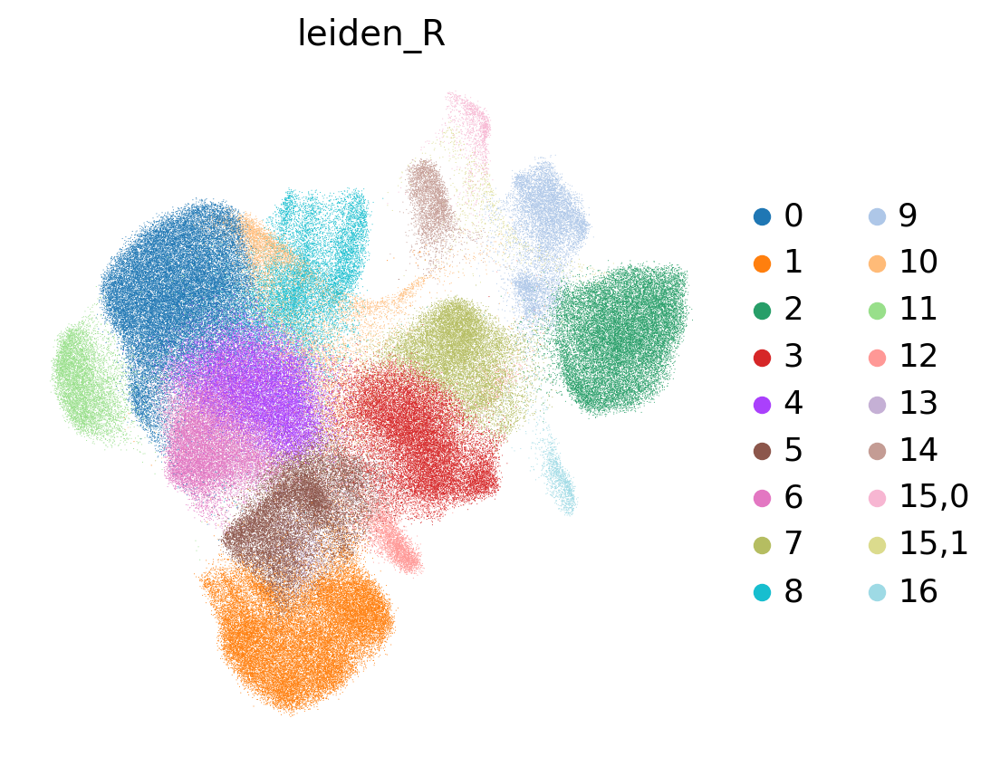

In [86]:
plt.rcParams['figure.figsize'] = [5,5]
#increase the clustering resolution within cluster 15
sc.tl.leiden(adata_t, resolution = 0.2, restrict_to = ["leiden",["15"]]) # run leiden clustering restricting to cluster 15.
sc.pl.umap(adata_t, color= "leiden_R",frameon=False)

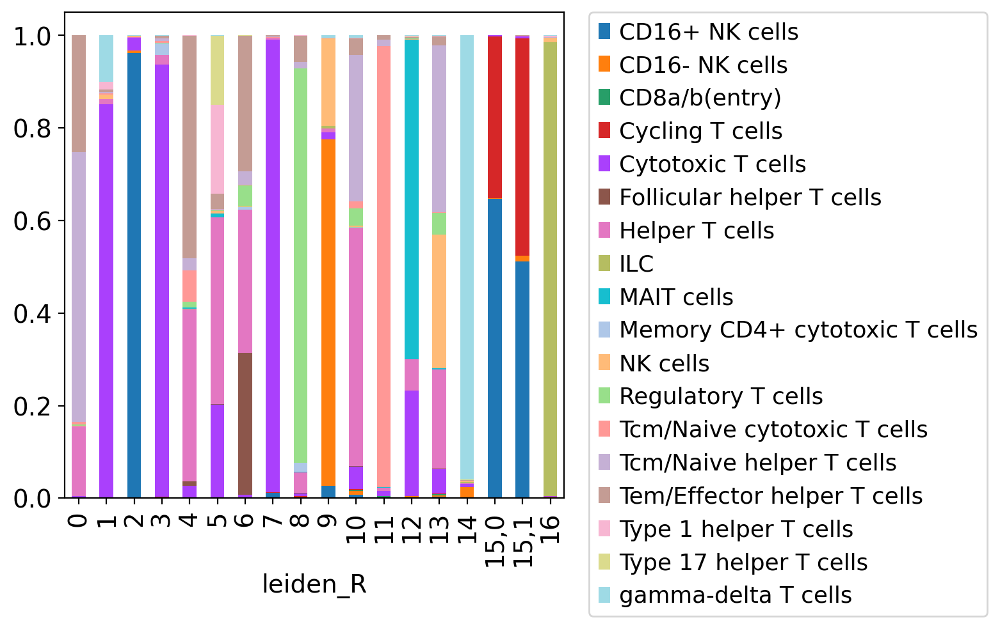

In [87]:
tmp = pd.crosstab(adata_t.obs['leiden_R'], adata_t.obs['Majority_voting_CellTypist'],normalize='index')
tmp.plot.bar(stacked=True, grid=False ).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

This approach does not always separate the clusters well, as was the case for our example. You can see that both clusters 15,0 ad 15,1 still have annotation of both cycling T cells and CD16+ NK cells. 

In [88]:
adata_t

AnnData object with n_obs × n_vars = 216611 × 1123
    obs: 'Organ', 'Donor', 'Chemistry', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Donor_colors', 'hvg', 'pca', 'neighbors', 'umap', 'Organ_colors', 'Chemistry_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'leiden_R_colors'
    obsm: 'X_umap', 'X_pca'
    varm: 'PCs'
    layers: 'X_explained'
    obsp: 'distances', 'connectivities'

In [89]:
#start with all raw counts
adata = adata_t.raw.to_adata()

#subset cluster 15 population based on clustering
adata_c15 = adata[adata.obs['leiden'].isin(['15']),:]
adata_c15.raw = adata_c15


#Calculate highly variable genes
sc.pp.highly_variable_genes(adata_c15, subset=True)
sc.pp.scale(adata_c15, max_value=10)


#perform batch correction & dimensionality reduction
bbknn.ridge_regression(adata_c15, batch_key=['Chemistry'], confounder_key=['Predicted_labels_CellTypist'])
sc.pp.pca(adata_c15)
bbknn.bbknn(adata_c15, batch_key='Donor')
sc.tl.umap(adata_c15)


In [103]:
sc.tl.leiden(adata_c15, resolution = 1.5) 


In [104]:
adata_c15

AnnData object with n_obs × n_vars = 1998 × 3805
    obs: 'Organ', 'Donor', 'Chemistry', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Manually_curated_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Donor_colors', 'hvg', 'pca', 'neighbors', 'umap', 'Organ_colors', 'Chemistry_colors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'leiden_R_colors', 'Majority_voting_CellTypist_colors'
    obsm: 'X_umap', 'X_pca'
    varm: 'PCs'
    layers: 'X_explained'
    obsp: 'distances', 'connectivities'

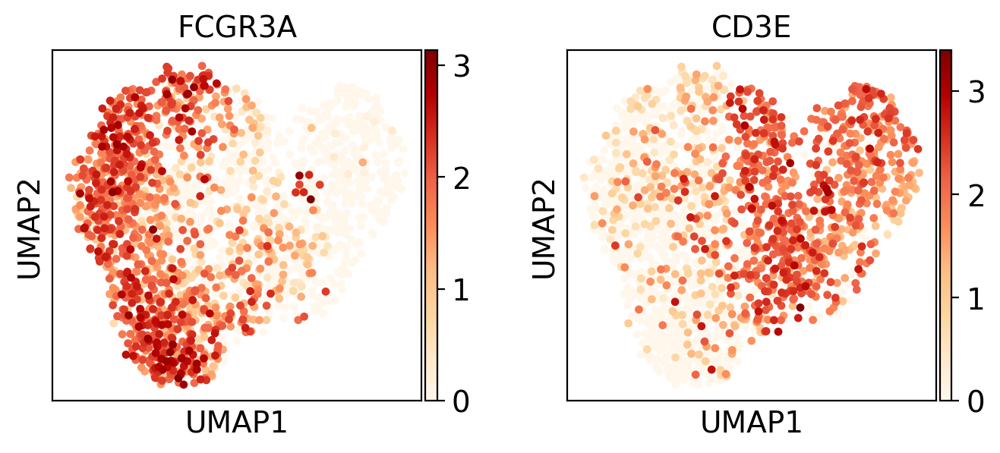

In [101]:
plt.rcParams['figure.figsize'] = [3,3]
sc.pl.umap(adata_c15, color=["FCGR3A", "CD3E"]) 
#Note FCG3A encodes CD16 protein. 
#In this case NK cell and T cell clusters separate better, 
#because we have recalculated highly variable genes amongst these two subsets.

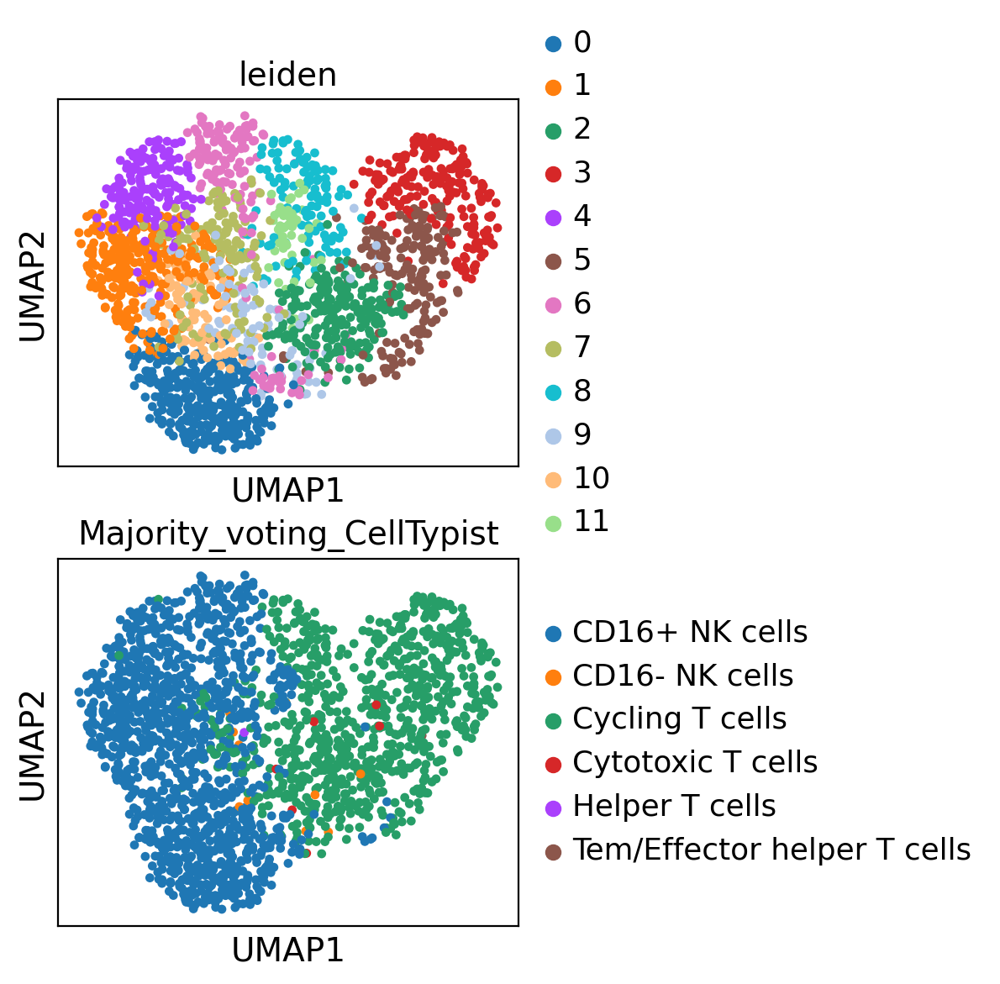

In [105]:
plt.rcParams['figure.figsize'] = [3,3]
sc.pl.umap(adata_c15, color=['leiden','Majority_voting_CellTypist' ], ncols=1) 
#clusters 2,3,4 are the cycling T cells & clusters 0,1,5,6,7 are CD16+ NK cells

In [106]:
#we can now renannotate the clusters 
tnk_annot =  {"0": "CD16+ NK cells",
                          "1": "CD16+ NK cells",
                          "2": "cycling T cells",
                          "3": "cycling T cells",
                          "4": "CD16+ NK cells",
                          "5": "cycling T cells",
                          "6": "CD16+ NK cells",
                          "7": "CD16+ NK cells",
                          "8": "cycling T cells",
                          "9": "cycling T cells",
                          "10": "CD16+ NK cells",
                          "11": "CD16+ NK cells"}
adata_c15.obs['manual_annot'] = adata_c15.obs['leiden'].map(tnk_annot)

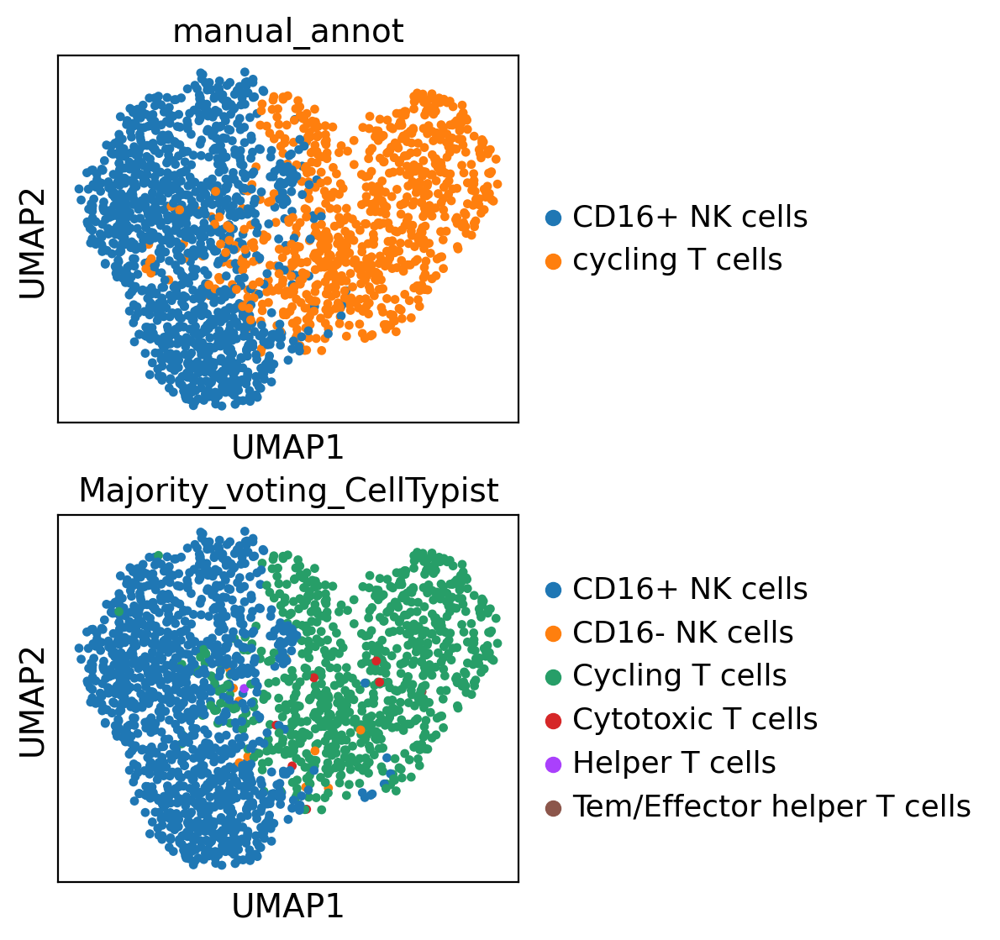

In [108]:
plt.rcParams['figure.figsize'] = [3,3]
sc.pl.umap(adata_c15, color=['manual_annot','Majority_voting_CellTypist' ], ncols=1) 
#clusters 2,3,4 are the cycling T cells & clusters 0,1,5,6,7 are CD16+ NK cells

This approach allows us to more precisely separate the cell types. 

In [111]:
#change the annotation of the subclustered object within the global object
ON = {O:N for O,N in zip(adata_c15.obs_names,adata_c15.obs["manual_annot"])}
adata_t.obs["leiden"] = [ON[O] if O in ON else N for O,N in zip(adata_t.obs_names,
                                                                    adata_t.obs["leiden"])]

... storing 'leiden' as categorical


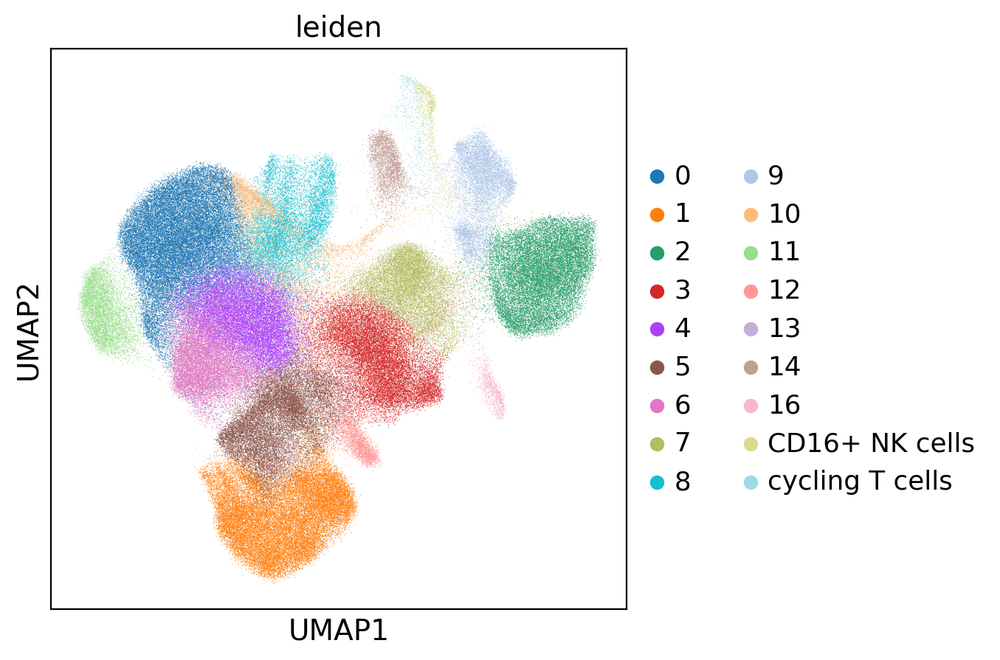

In [112]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata_t, color=['leiden'], ncols=1) 

**Task**: in your free time annotate the remaining clusters. 

What if you want to subset cells that express your favourite gene. Let's say we want to subset all cells that express GZMB

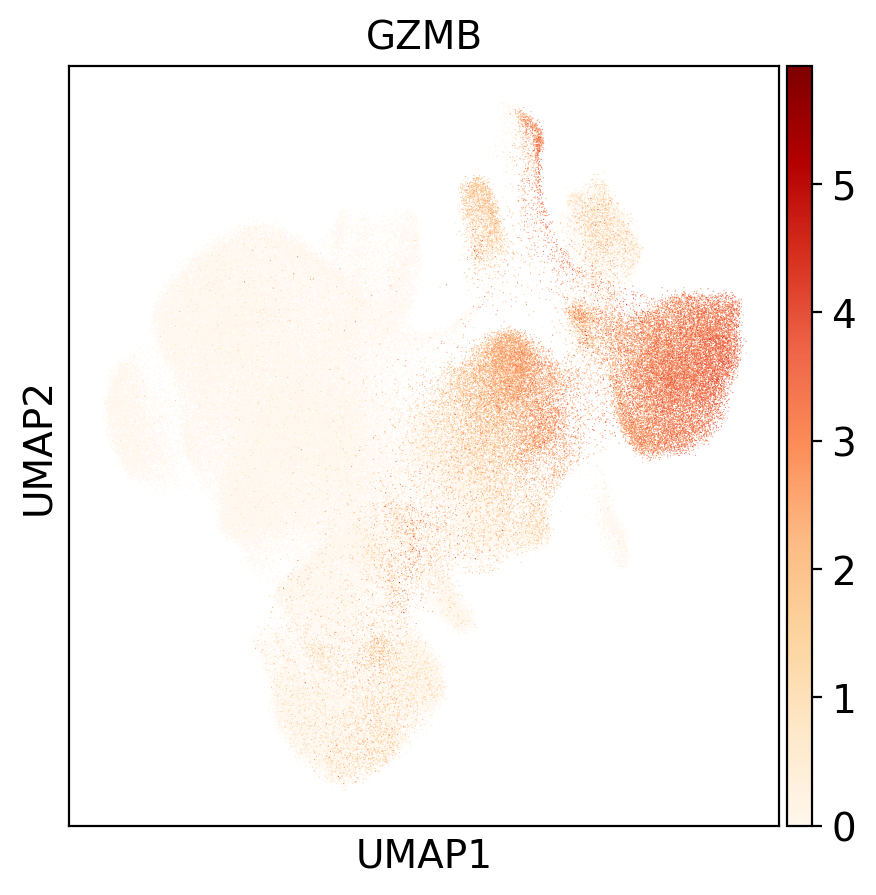

In [113]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata_t, color=['GZMB'], ncols=1) 

In [114]:
# subset cells based on expression of a gene
df = pd.DataFrame(adata_t.X, index=adata_t.obs_names, columns=adata_t.var_names)
GZMB_cell = adata_t[adata_t.obs_names.isin(df.index[df["GZMB"]>1])]

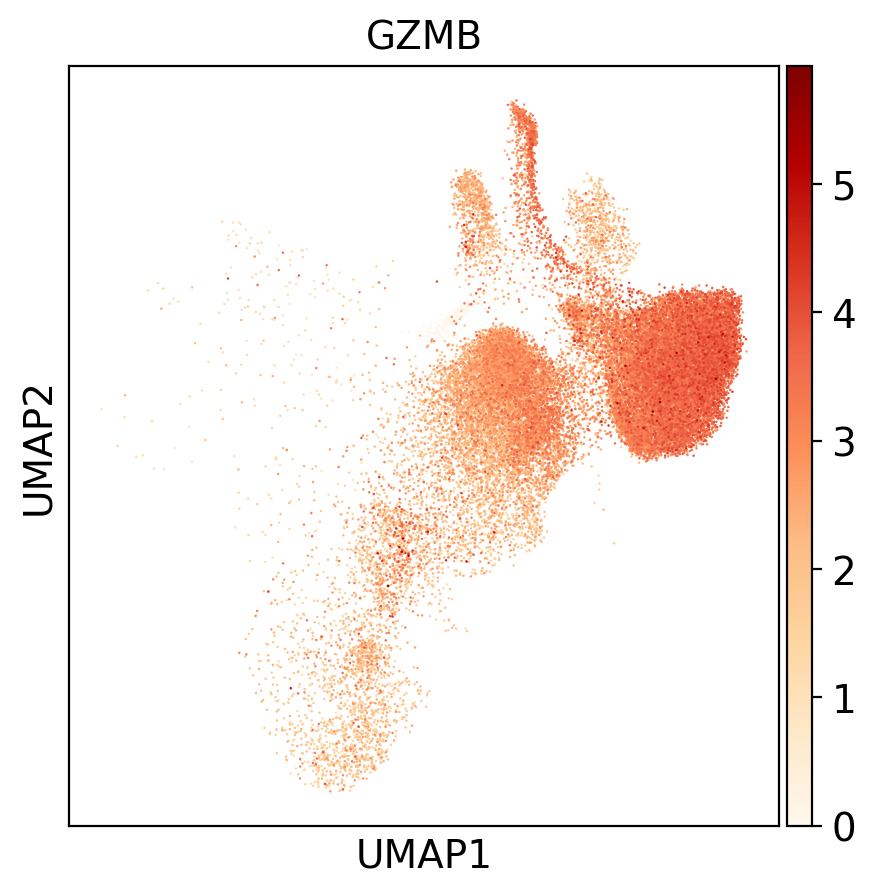

In [115]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(GZMB_cell, color=['GZMB'], ncols=1) 

## 3.2 Gene signature scoring

Sometimes we want to ask what is the expression of a set of a genes across cells. This set of genes may make up a gene expression program we are interested in. Another benefit at looking at gene sets is it reduces the effects of drop outs.

Below, we look at genes involved in the cell cycle. First, we assign each cell a score, based on its expression of G2/M and S phase markers. These marker sets should be anticorrelated in their expression levels, and cells expressing neither are likely not cycling and are in G1 phase.

We assign scores in the CellCycleScoring function, which stores S and G2/M scores in object meta data, along with the predicted classification of each cell in either G2M, S or G1 phase. CellCycleScoring can also set the identity of the Seurat object to the cell-cycle phase by passing set.ident = TRUE (the original identities are stored as old.ident). Please note that Seurat does not use the discrete classifications (G2M/G1/S) in downstream cell cycle regression. Instead, it uses the quantitative scores for G2M and S phase. However, we provide our predicted classifications in case they are of interest.

In [120]:
#Calculate cell cycle phase using a subset of data
cell_cycle_genes = [x.strip() for x in open('/mnt/old_projects/PROJECTS/SCP/Data_analysis/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(GZMB_cell, s_genes=s_genes, g2m_genes=g2m_genes, use_raw=True)
GZMB_cell = GZMB_cell[GZMB_cell.obs.G2M_score.sort_values(ascending=True).index].copy()

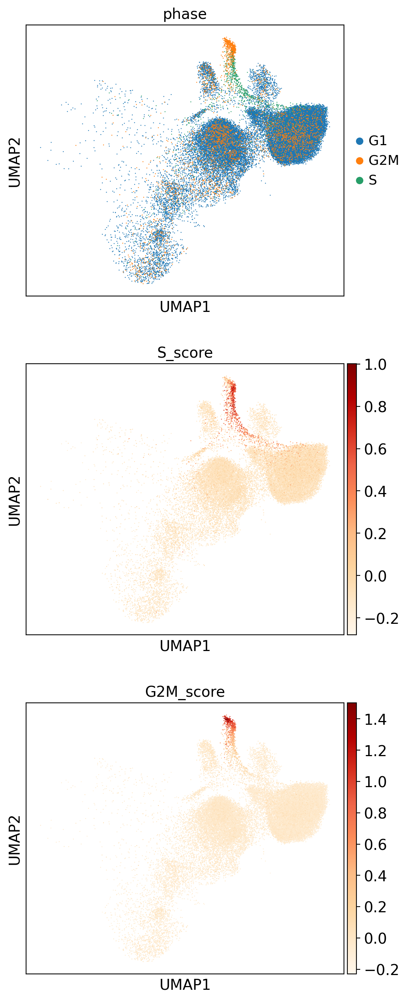

In [123]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(GZMB_cell, color=['phase', 'S_score', 'G2M_score'], ncols=1) 

## 4.2 Using CellTypist model of immune cells for automatic cell annotation. 

In this tutorial we demonstrate how to use a CellTypist model for automatic cell type annotation. A detailed description of the model can be found in [Dominguez Conde et al., Science, 2022](https://www.science.org/doi/10.1126/science.abl5197).

We have already installed the celltypist python package at the beginning of this tutorial. Now we need a celltypist reference model trained on the immune cells. 

Different cell type reference models are available from the [CellTypist website](https://www.celltypist.org/models). It is important to select the most appropriate dataset for your query reference data as circulating and tissue-resident immune populations have transcriptional differences that set them apart and thus can lead to low-confidence or false predictions if the wrong reference data is used.  

In [124]:
!wget https://cellgeni.cog.sanger.ac.uk/developmentcellatlas/fetal-immune/celltypist_model.Pan_Fetal_Human.pkl

--2022-06-23 12:25:52--  https://cellgeni.cog.sanger.ac.uk/developmentcellatlas/fetal-immune/celltypist_model.Pan_Fetal_Human.pkl
Resolving cellgeni.cog.sanger.ac.uk (cellgeni.cog.sanger.ac.uk)... 172.27.51.1, 172.27.51.130, 172.27.51.3, ...
Connecting to cellgeni.cog.sanger.ac.uk (cellgeni.cog.sanger.ac.uk)|172.27.51.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4078788 (3.9M) [application/octet-stream]
Saving to: ‘celltypist_model.Pan_Fetal_Human.pkl.1’

celltypist_model.Pa 100%[===================>]   3.89M  --.-KB/s    in 0.01s   

2022-06-23 12:25:52 (279 MB/s) - ‘celltypist_model.Pan_Fetal_Human.pkl.1’ saved [4078788/4078788]



In [125]:
model = celltypist.models.Model.load(model = 'celltypist_model.Pan_Fetal_Human.pkl')

In [126]:
model.description

{'date': '2021-12-08 19:51:25.771934',
 'details': 'stromal and immune populations from the human fetus',
 'url': 'https://celltypist.cog.sanger.ac.uk/models/Pan_Fetal_Suo/Pan_Fetal_Human.pkl',
 'number_celltypes': 138}

We can have a look at the cell types included in this model

In [127]:
model.cell_types

array(['ABT(ENTRY)', 'AS_DC', 'B1', 'CD4+T', 'CD8+T', 'CD8AA',
       'CHONDROCYTE', 'CMP', 'CYCLING_B', 'CYCLING_DC',
       'CYCLING_EPITHELIUM', 'CYCLING_FIBROBLAST_I',
       'CYCLING_FIBROBLAST_II', 'CYCLING_ILC', 'CYCLING_MEMP',
       'CYCLING_MPP', 'CYCLING_NK', 'CYCLING_PDC', 'CYCLING_T',
       'CYCLING_YS_ERY', 'DC1', 'DC2', 'DC_PROGENITOR',
       'DEVELOPING_NEPHRON_I', 'DEVELOPING_NEPHRON_II', 'DN(P)_T',
       'DN(Q)_T', 'DN(early)_T', 'DOUBLET', 'DOUBLETS_FIBRO_ERY',
       'DOUBLET_ENDOTHELIUM_ERYTHROCYTE', 'DOUBLET_ERY_B',
       'DOUBLET_IMMUNE_FIBROBLAST', 'DOUBLET_LYMPHOID_MACROPHAGE',
       'DOUBLET_VSMC_ERYTHROCYTE', 'DP(P)_T', 'DP(Q)_T', 'EARLY_ERY',
       'EARLY_MK', 'ENDOTHELIUM_I', 'ENDOTHELIUM_II', 'ENDOTHELIUM_III',
       'ENDOTHELIUM_IV', 'ENDOTHELIUM_V', 'ENTEROENDOCRINE_I',
       'ENTEROENDOCRINE_II', 'EOSINOPHIL_BASOPHIL', 'EPITHELIUM_I',
       'EPITHELIUM_II', 'FIBROBLAST_I', 'FIBROBLAST_II', 'FIBROBLAST_III',
       'FIBROBLAST_IV', 'FIBROBLAST_I

### Load query dataset

In this tutorial we predict cell identity in a scRNA-seq dataset generated from iPSC derived T cells (Artificial Thimic Organoids).

In [128]:
!wget https://cellgeni.cog.sanger.ac.uk/developmentcellatlas/fetal-immune/ATO_adata.h5ad

--2022-06-23 12:25:58--  https://cellgeni.cog.sanger.ac.uk/developmentcellatlas/fetal-immune/ATO_adata.h5ad
Resolving cellgeni.cog.sanger.ac.uk (cellgeni.cog.sanger.ac.uk)... 172.27.51.1, 172.27.51.130, 172.27.51.3, ...
Connecting to cellgeni.cog.sanger.ac.uk (cellgeni.cog.sanger.ac.uk)|172.27.51.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211505998 (202M) [application/x-hdf]
Saving to: ‘ATO_adata.h5ad.1’

ATO_adata.h5ad.1    100%[===================>] 201.71M   309MB/s    in 0.7s    

2022-06-23 12:25:58 (309 MB/s) - ‘ATO_adata.h5ad.1’ saved [211505998/211505998]



In [129]:
query_adata = sc.read_h5ad('./ATO_adata.h5ad')

The expression matrix query_adata.X needs to be pre-processed as log1p normalised expression to 10,000 counts per cell.

In [130]:
sc.pp.normalize_per_cell(query_adata, counts_per_cell_after=1e4)
sc.pp.log1p(query_adata)

In [131]:
query_adata.X.expm1().sum(axis = 1)

matrix([[ 9999.999],
        [10000.   ],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.   ]], dtype=float32)

Some pre-existing cell annotation is present, which we will compare with the CellTypist prediction

In [132]:
query_adata.obs['annotation']

AAACCTGAGGCGACAT-1_6180STDY9448808      ERY
AAACCTGAGGTAGCTG-1_6180STDY9448808    DN/DP
AAACCTGCAATCCAAC-1_6180STDY9448808      ERY
AAACCTGCATCACGTA-1_6180STDY9448808      ERY
AAACCTGGTCAAGCGA-1_6180STDY9448808    DN/DP
                                      ...  
TTTGTCACAGGAATCG-1_6180STDY9448813     SP_T
TTTGTCACAGGGTACA-1_6180STDY9448813     SP_T
TTTGTCAGTAGCACGA-1_6180STDY9448813     SP_T
TTTGTCAGTAGTGAAT-1_6180STDY9448813    DN/DP
TTTGTCATCGGATGTT-1_6180STDY9448813    DN/DP
Name: annotation, Length: 10459, dtype: category
Categories (8, object): ['ABT(ENTRY)', 'DN/DP', 'ERY', 'HIGH_MITO', 'ILC3', 'MAST CELL', 'NK', 'SP_T']

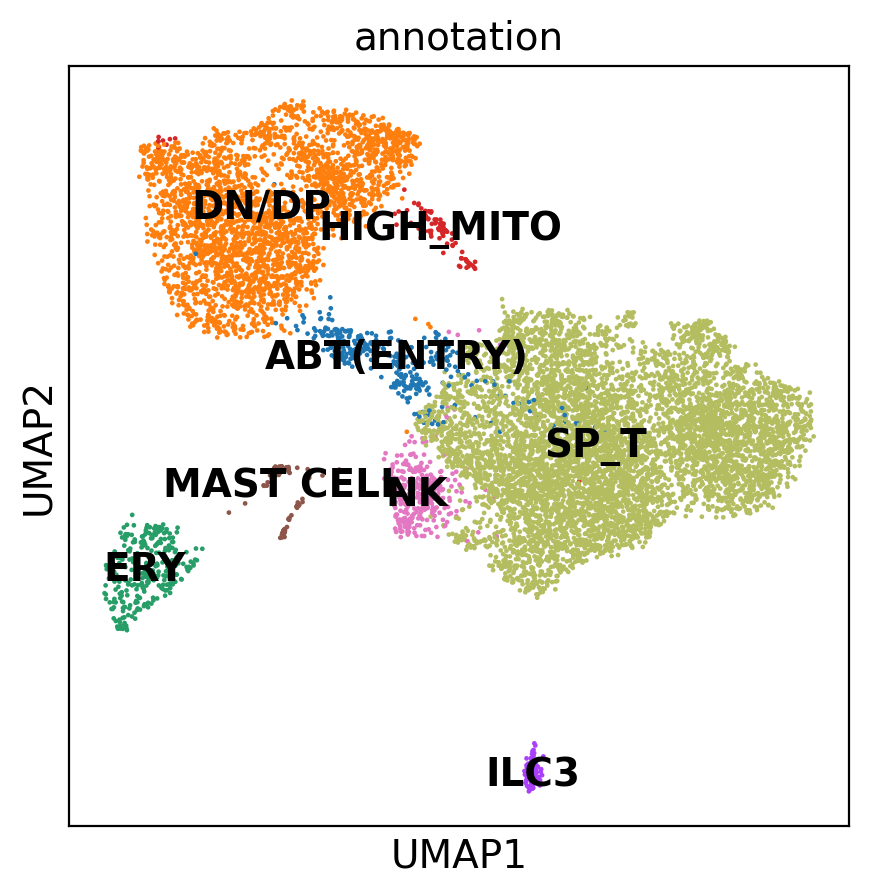

In [133]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(query_adata, color=['annotation'], legend_loc='on data')

Let's make sure that the query_adata.var_names corresponds to the features used to train the model.

In [134]:
model.features

array(['TSPAN6', 'TNMD', 'DPM1', ..., 'AL513493.1', 'AC016831.7',
       'LINC00842'], dtype=object)

In [135]:
query_adata.var

,gene_ids,gene_names
ENSG00000000003,ENSG00000000003,TSPAN6
ENSG00000000005,ENSG00000000005,TNMD
ENSG00000000419,ENSG00000000419,DPM1
ENSG00000000457,ENSG00000000457,SCYL3
ENSG00000000460,ENSG00000000460,C1orf112
...,...,...
ENSG00000285492,ENSG00000285492,AL356417.3
ENSG00000285505,ENSG00000285505,AC010616.2
ENSG00000285508,ENSG00000285508,AL034430.1
ENSG00000285509,ENSG00000285509,AP000646.1


In [136]:
query_adata.var_names = query_adata.var.gene_names

We can use default settings to predict cell identity independently for each cell.

In [137]:
predictions = celltypist.annotate(query_adata, model = model)

🔬 Input data has 10459 cells and 33538 genes
🔗 Matching reference genes in the model
🧬 6971 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [138]:
query_adata = predictions.to_adata()

In [139]:
n_cells = query_adata.obs['predicted_labels'].value_counts()
n_cells[0:30]

TYPE_1_INNATE_T                5478
DP(Q)_T                        1076
DP(P)_T                         781
DN(Q)_T                         540
CYCLING_NK                      488
CYCLING_T                       345
TYPE_3_INNATE_T                 327
YS_ERY                          248
HIGH_MITO                       197
CD8+T                           129
DN(P)_T                         118
TREG                            108
NK                               99
ILC3                             88
ABT(ENTRY)                       57
CD8AA                            48
MAST_CELL                        31
MACROPHAGE_ERY                   27
DN(early)_T                      26
CD4+T                            22
DOUBLET_LYMPHOID_MACROPHAGE      20
DOUBLET                          20
LOW_Q_INCONSISTENT               18
LATE_ERY                         16
PROMYELOCYTE                     14
DOUBLET_IMMUNE_FIBROBLAST         8
CYCLING_ILC                       8
MATURE_B                    

... storing 'predicted_labels' as categorical


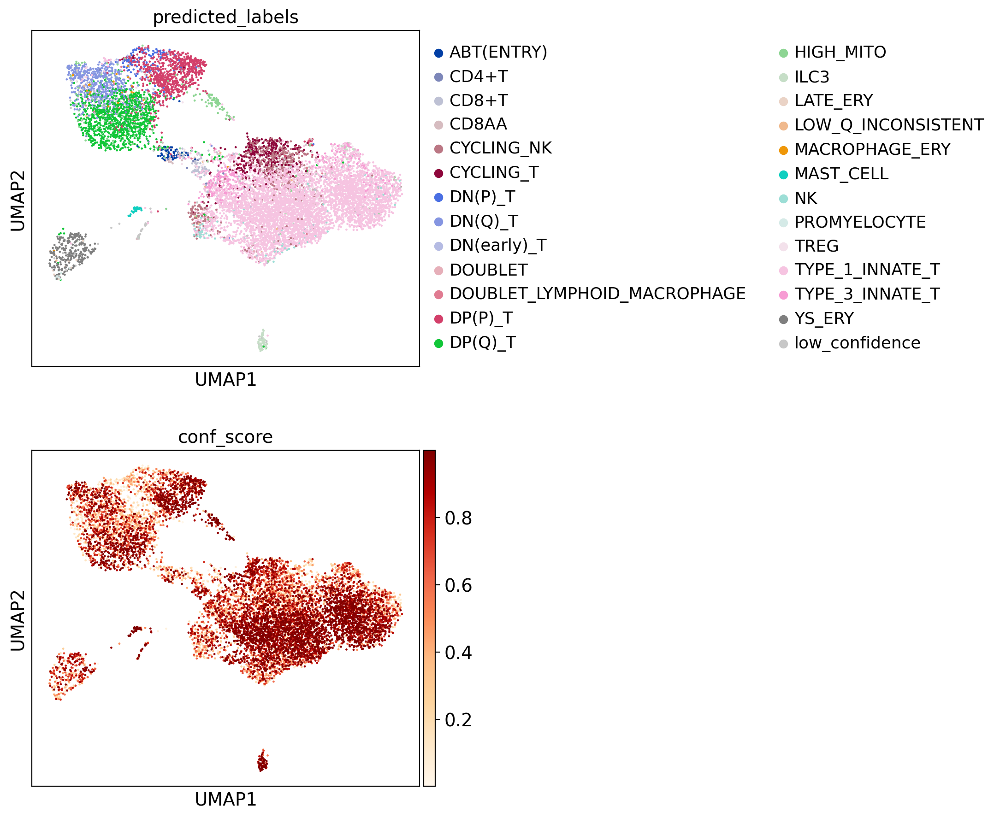

In [140]:
## Exclude low abundance predictions (if a label is given to less than 10 cells)
low_ab_predictions = n_cells.index[n_cells < 10]
query_adata.obs['predicted_labels'] = query_adata.obs['predicted_labels'].astype("str")
query_adata.obs.loc[query_adata.obs['predicted_labels'].isin(low_ab_predictions), 'predicted_labels'] = 'low_confidence'
sc.pl.umap(query_adata, color=['predicted_labels', 'conf_score'], ncols=1)


The confidence score gives us a measure of uncertainty in the predicted annotation

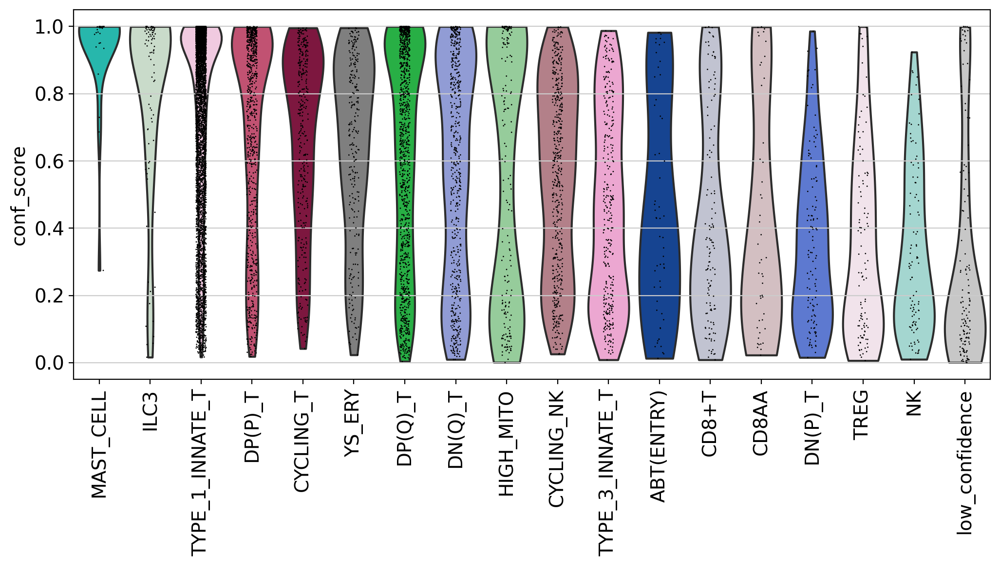

In [141]:
def _plot_sorted_violin(adata, groupby, y_value):
    n_cells_anno = adata.obs[[groupby,y_value]].value_counts(groupby)
    keep_anno = n_cells_anno.index[n_cells_anno > 30]

    mean_sim = adata.obs[[groupby,y_value]].groupby(groupby).mean()
    anno_order = mean_sim.loc[keep_anno].sort_values(y_value, ascending=False).index.tolist()

    adata.var_names_make_unique()
    sc.pl.violin(adata[adata.obs[groupby].isin(keep_anno)], 
                                     y_value, groupby=groupby, rotation=90, 
                                     order=anno_order)

plt.rcParams['figure.figsize'] = [10,5]
_plot_sorted_violin(query_adata, y_value='conf_score', groupby='predicted_labels')


Compare with existing annotations

<AxesSubplot:xlabel='predicted_labels', ylabel='annotation'>

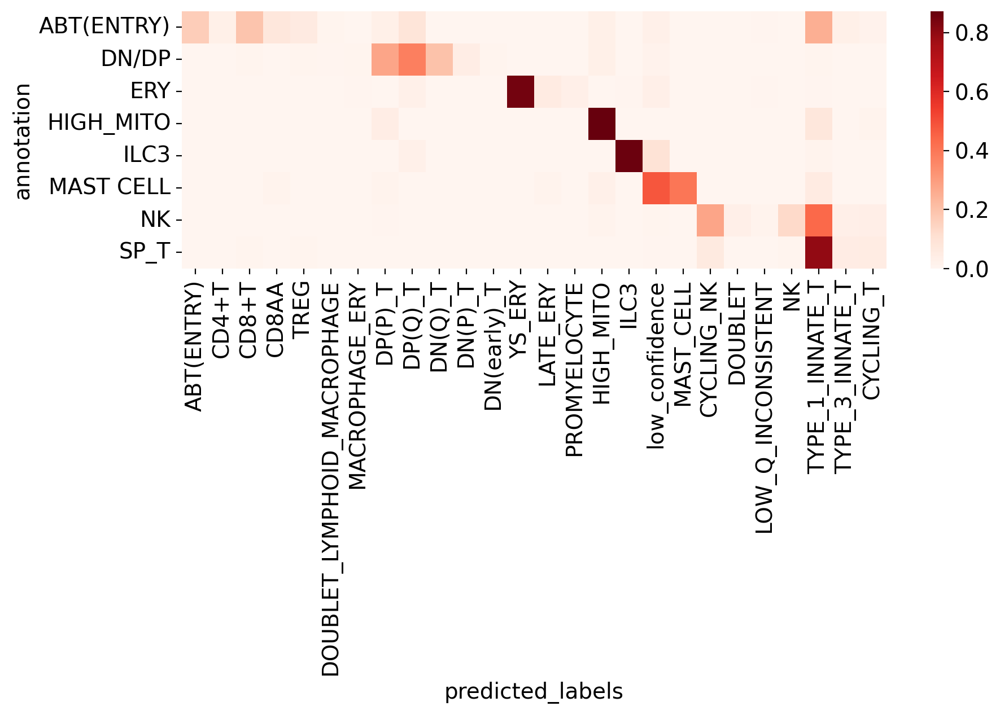

In [142]:
plt.rcParams['figure.figsize'] = [10,3]
conf_mat = sc.metrics.confusion_matrix('annotation', "predicted_labels",  query_adata.obs, normalize=True)

col_order = conf_mat.idxmax(0).sort_values().index
conf_mat = conf_mat[col_order] ## Sort to have some sort of diagonal
sns.heatmap(conf_mat, xticklabels=True, yticklabels=True, cmap='Reds')

**Task**: Can you use the fetal model to predict the adult T cell object we have analysed? 

In [143]:
model = celltypist.models.Model.load(model = 'celltypist_model.Pan_Fetal_Human.pkl')

In [144]:
predictions = celltypist.annotate(adata_t, model = model)
adata_t = predictions.to_adata()

👀 Detected scaled expression in the input data, will try the .raw attribute
🔬 Input data has 216611 cells and 36601 genes
🔗 Matching reference genes in the model
🧬 6890 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [145]:
n_cells = adata_t.obs['predicted_labels'].value_counts()
n_cells[0:30]

CD4+T                          56021
TYPE_1_INNATE_T                48822
NK                             27353
TREG                           19219
TYPE_3_INNATE_T                14904
HIGH_MITO                      12400
CD8+T                          10761
DOUBLET_LYMPHOID_MACROPHAGE     4975
CYCLING_NK                      3849
ILC3                            3202
MACROPHAGE_ERY                  2755
DOUBLET                         1021
ABT(ENTRY)                       944
MATURE_B                         713
MEMP                             589
EOSINOPHIL_BASOPHIL              561
B1                               474
MOP                              443
LMPP_MLP                         431
CYCLING_T                        369
MID_ERY                          297
DOUBLET_ERY_B                    277
MACROPHAGE_MHCII_HIGH            223
MONOCYTE_I_CXCR4                 220
DOUBLET_IMMUNE_FIBROBLAST        216
CMP                              209
SMALL_PRE_B                      203
M

... storing 'predicted_labels' as categorical


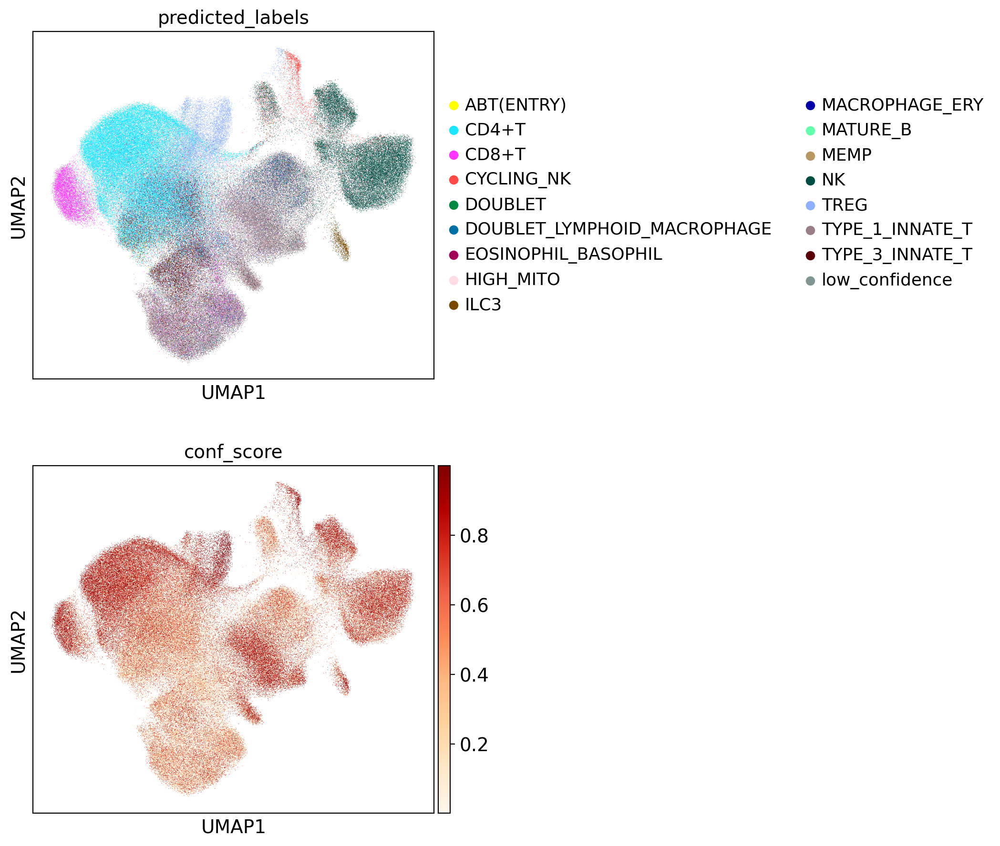

In [149]:
plt.rcParams['figure.figsize'] = [5,5]
## Exclude low abundance predictions (if a label is given to less than 500 cells)
low_ab_predictions = n_cells.index[n_cells < 500]
adata_t.obs['predicted_labels'] = adata_t.obs['predicted_labels'].astype("str")
adata_t.obs.loc[adata_t.obs['predicted_labels'].isin(low_ab_predictions), 'predicted_labels'] = 'low_confidence'
sc.pl.umap(adata_t, color=['predicted_labels', 'conf_score'], ncols=1)

<AxesSubplot:xlabel='predicted_labels', ylabel='Majority_voting_CellTypist'>

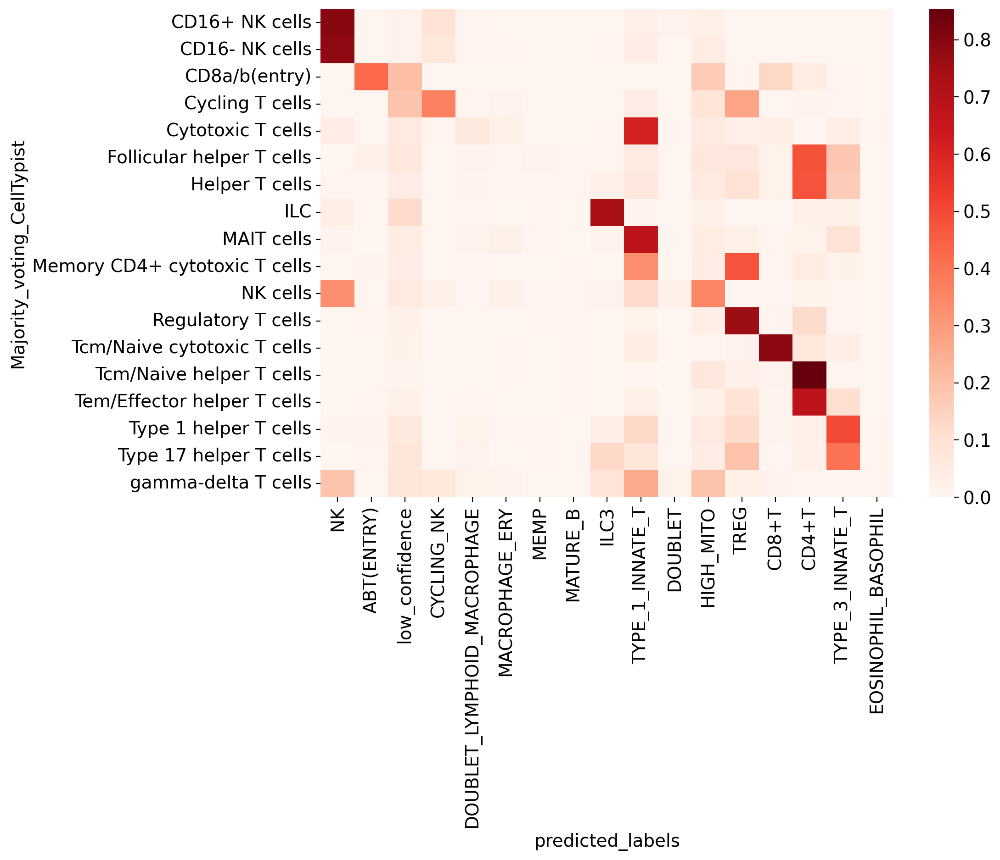

In [150]:
plt.rcParams['figure.figsize'] = [10,7]
conf_mat = sc.metrics.confusion_matrix('Majority_voting_CellTypist', "predicted_labels",  adata_t.obs, normalize=True)

col_order = conf_mat.idxmax(0).sort_values().index
conf_mat = conf_mat[col_order] ## Sort to have some sort of diagonal
sns.heatmap(conf_mat, xticklabels=True, yticklabels=True, cmap='Reds')

As you can see, major broad cell types are predicted correctly (e.g. NK cells, ILCs). However, using fetal atlas dataset for prediction lead to innacuracies - for example, Type 1 and Type 17 helper cells are predicted as Type 1 and Type 17 Innate T cells that have only been described in the fetal data. Therefore, it is important to:
1. Select an appropriate training reference (like we did for fetal vs iPSC-derived T cell comparison). 
2. Use caution when interpreting the results from automated annotation. 

# 6. Prepare data for ligand-receptor analysis using CellphoneDB

There are many online tools that require different scRNA-seq inputs for analysis. Therefore, it is important to know how to manipulate the Seurat object to extract data required to run a specific tool. 

Here we show how to prepare input files for CellphoneDB- a publicly available repository of curated receptors, ligands and their interactions (https://www.cellphonedb.org/). It can be used to search for a particular ligand/receptor or interrogate your own single-cell transcriptomics data. You will analyse the output of CellphoneDB tool in Day 3. 

The input files required are: 

- COUNTS file: scRNAseq count data containing gene expression values where rows are genes with Ensembl IDs and columns are cells. We recommend using normalised counts. Format accepted: .csv (comma separated) or .txt, .tsv, .tab.

- META file: Cell type annotation. Format accepted: .csv (comma separated) or .txt, .tsv, .tab (tab separated).

Let's use the ATO organoid data to prepare these files

In [151]:
query_adata = sc.read_h5ad('./ATO_adata.h5ad')

In [152]:
query_adata.X.max()

4347.0

In [154]:
sc.pp.normalize_per_cell(query_adata, counts_per_cell_after=1e4)

In [216]:
query_adata.obs.annotation.value_counts()

SP_T          6561
DN/DP         2720
ABT(ENTRY)     329
NK             306
ERY            291
HIGH_MITO       94
ILC3            81
MAST CELL       77
Name: annotation, dtype: int64

In [217]:
chosen_idx = query_adata.obs.groupby("annotation").sample(n=77, random_state=1).index
query_adata_downsampled = query_adata[query_adata.obs_names.isin(chosen_idx)]

In [219]:
query_adata_downsampled.obs.annotation.value_counts()

ABT(ENTRY)    77
DN/DP         77
ERY           77
HIGH_MITO     77
ILC3          77
MAST CELL     77
NK            77
SP_T          77
Name: annotation, dtype: int64

In [220]:
counts = pd.DataFrame(query_adata_downsampled.X.todense(), columns = query_adata_downsampled.var["gene_ids"], index = query_adata_downsampled.obs_names)
counts.columns = counts.columns.tolist()
counts = counts.T
counts[0:10]
counts.to_csv("./trim2cellphone_normalised_counts.txt")

In [266]:
counts.head(5)

,AAACCTGCAATCCAAC-1_6180STDY9448808,AAACCTGGTTACGTCA-1_6180STDY9448808,AAACGGGCAGACGCCT-1_6180STDY9448808,AAACGGGCATATGGTC-1_6180STDY9448808,AAACGGGTCAACCATG-1_6180STDY9448808,AAACGGGTCCACGTTC-1_6180STDY9448808,AAAGCAACAAGAAAGG-1_6180STDY9448808,AAAGTAGAGCAGGCTA-1_6180STDY9448808,AACACGTAGTGAAGAG-1_6180STDY9448808,AACGTTGGTACCGTTA-1_6180STDY9448808,...,TTAACTCCACGCCAGT-1_6180STDY9448813,TTAGGACAGTGGTCCC-1_6180STDY9448813,TTAGTTCAGCTGTCTA-1_6180STDY9448813,TTCGAAGAGAACTGTA-1_6180STDY9448813,TTCTCAATCTGCCCTA-1_6180STDY9448813,TTCTCCTTCCTAGGGC-1_6180STDY9448813,TTGCGTCAGTCTCGGC-1_6180STDY9448813,TTGGCAAGTACCCAAT-1_6180STDY9448813,TTTACTGCAGATAATG-1_6180STDY9448813,TTTGGTTAGAGTAATC-1_6180STDY9448813
ENSG00000000003,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,1.762736,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,0.000000
ENSG00000000005,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,0.000000
ENSG00000000419,0.0,0.0,0.0,1.292157,0.0,0.0,3.35233,0.0,0.000000,1.404297,...,0.878889,0.0,0.0,0.0,0.0,1.54012,2.447381,0.0,0.0,0.000000
ENSG00000000457,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,4.110152
ENSG00000000460,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,0.000000


In [222]:
meta = pd.DataFrame(query_adata_downsampled.obs.annotation)
query_adata_downsampled.columns = ['cell_type']
meta.to_csv("./trim2cellphone_normalised_meta.txt")

In [223]:
meta

,annotation
AAACCTGCAATCCAAC-1_6180STDY9448808,ERY
AAACCTGGTTACGTCA-1_6180STDY9448808,ILC3
AAACGGGCAGACGCCT-1_6180STDY9448808,HIGH_MITO
AAACGGGCATATGGTC-1_6180STDY9448808,DN/DP
AAACGGGTCAACCATG-1_6180STDY9448808,DN/DP
...,...
TTCTCCTTCCTAGGGC-1_6180STDY9448813,SP_T
TTGCGTCAGTCTCGGC-1_6180STDY9448813,SP_T
TTGGCAAGTACCCAAT-1_6180STDY9448813,ABT(ENTRY)
TTTACTGCAGATAATG-1_6180STDY9448813,SP_T


### The End

Credits:
- https://github.com/Teichlab/Pan_fetal_immune/tree/master/tutorials

- https://github.com/Teichlab/TissueImmuneCellAtlas

Based on: 
- https://github.com/Raselel/EMBL-EBI-R-course-for-scRNAseq